# PACKAGES AND LIBRARIES

In [1]:
!pip install mpl-toolkits.clifford

   ---------------------------------------- 0.0/2.8 MB ? eta -:--:--
   -------------- ------------------------- 1.0/2.8 MB 6.3 MB/s eta 0:00:01
   --------------------------------- ------ 2.4/2.8 MB 6.4 MB/s eta 0:00:01
   ---------------------------------------- 2.8/2.8 MB 6.3 MB/s eta 0:00:00
   ---------------------------------------- 0.0/30.3 MB ? eta -:--:--
   - -------------------------------------- 1.3/30.3 MB 6.7 MB/s eta 0:00:05
   --- ------------------------------------ 2.6/30.3 MB 6.6 MB/s eta 0:00:05
   ----- ---------------------------------- 4.2/30.3 MB 6.6 MB/s eta 0:00:04
   ------- -------------------------------- 5.8/30.3 MB 6.8 MB/s eta 0:00:04
   --------- ------------------------------ 7.1/30.3 MB 6.7 MB/s eta 0:00:04
   ----------- ---------------------------- 8.7/30.3 MB 6.7 MB/s eta 0:00:04
   ------------- -------------------------- 10.0/30.3 MB 6.7 MB/s eta 0:00:04
   --------------- ------------------------ 11.5/30.3 MB 6.7 MB/s eta 0:00:03
   ------------

In [10]:
import pandas as pd
import cv2
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.cm as mtpltcm
from mpl_toolkits.mplot3d import Axes3D
import random
import folium
from folium.plugins import HeatMap, HeatMapWithTime
from folium import plugins
from netCDF4 import Dataset
import cartopy.crs as ccrs
import pydub
from scipy.io.wavfile import read, write
import librosa
import librosa.display
import IPython
from IPython.display import Audio
import scipy
# import skimage2
from IPython.display import HTML
import matplotlib.animation as animation
import PIL
from scipy import signal
from scipy.fft import fftshift
from mpl_toolkits.mplot3d import art3d
import os

import os.path
from pathlib import Path
import glob


from warnings import filterwarnings

filterwarnings("ignore",category=DeprecationWarning)
filterwarnings("ignore", category=FutureWarning) 
filterwarnings("ignore", category=UserWarning)
filterwarnings("ignore", category=RuntimeWarning)

# DATA OVERVIEW AND NETCDF

In [11]:
ALL_CDF_PATH = "CSR_GRACE_GRACE-FO_RL06_Mascons_all-corrections_v02.nc"
READ_CDF = Dataset(ALL_CDF_PATH)

In [12]:
READ_CDF

<class 'netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    Conventions: CF-1.6, ACDD-1.3, ISO 8601
    filename: netcdf/CSR_GRACE_GRACE-FO_RL06_Mascons_all-corrections_v02.nc
    Metadata_Conventions: Unidata Dataset Discovery v1.0
    standard_name_vocabulary: NetCDF Climate and Forecast (CF) Metadata Convention-1.6
    title: CSR GRACE and GRACE-FO MASCON RL06Mv2
    subtitle: GRACE/GRACE-FO Total water storage with all correction applied
    summary: Monthly mass anomaly grids from GRACE and GRACE-FO determined from CSR RL06 processing
    keywords: Solid Earth, Geodetics/Gravity, Gravity, liquid_water_equivalent_thickness
    keywords_vocabulary: NASA Global Change Master Directory (GCMD) Science Keywords
    platform: GRACE and GRACE-FO
    institution: The University of Texas - Center for Space Research (CSR)
    creator_name: Himanshu Save
    creator_email: grace@csr.utexas.edu
    creator_url: http://www2.csr.utexas.edu/grace
    creator_type: group
    c

In [13]:
print(READ_CDF.variables.keys())

dict_keys(['time_bounds', 'time', 'lon', 'lat', 'lwe_thickness'])


In [14]:
print(READ_CDF.variables["lwe_thickness"].long_name)

Liquid_Water_Equivalent_Thickness


In [15]:
print(READ_CDF.variables["lwe_thickness"].dimensions)

('time', 'lat', 'lon')


In [16]:
print(READ_CDF.variables["lwe_thickness"].datatype)

float32


In [17]:
print(READ_CDF.variables["lwe_thickness"].shape)

(198, 720, 1440)


In [18]:
print(READ_CDF.variables["lwe_thickness"].coordinates)

time lat lon


In [19]:
print(READ_CDF.variables["lwe_thickness"].name)

lwe_thickness


In [20]:
print(READ_CDF.variables["time_bounds"])

<class 'netCDF4.Variable'>
float32 time_bounds(time, timebound)
unlimited dimensions: 
current shape = (198, 2)
filling on, default _FillValue of 9.969209968386869e+36 used


In [21]:
print(READ_CDF.variables["time_bounds"].datatype)

float32


In [22]:
print(READ_CDF.variables["time_bounds"].name)

time_bounds


In [23]:
print(READ_CDF.variables["time_bounds"].ndim)

2


In [24]:
print(READ_CDF.variables["time_bounds"].shape)

(198, 2)


In [25]:
print(READ_CDF.variables["lwe_thickness"])

<class 'netCDF4.Variable'>
float32 lwe_thickness(time, lat, lon)
    grid_mapping: WGS84
    coordinates: time lat lon
    standard_name: Liquid_Water_Equivalent_Thickness
    long_name: Liquid_Water_Equivalent_Thickness
    Units: cm
unlimited dimensions: 
current shape = (198, 720, 1440)
filling on, default _FillValue of 9.969209968386869e+36 used


In [26]:
LWE_THICKNESS_GENERAL = READ_CDF.variables["lwe_thickness"][0,:,:]
LAT_DATA = READ_CDF.variables["lat"][:]
LON_DATA = READ_CDF.variables["lon"][:]
TIME_DATA = READ_CDF.variables["time"][:]

In [27]:
LAT_TH = LWE_THICKNESS_GENERAL[:,0]
LON_TH = LWE_THICKNESS_GENERAL[0,:]

LAT_TH_SER = pd.Series(LAT_TH,name="LAT_THICKNESS").astype(float)
LON_TH_SER = pd.Series(LON_TH,name="LON_THICKNESS").astype(float)

TIME_SER = pd.Series(TIME_DATA,name="TIME").astype(float)
LAT_SER = pd.Series(LAT_DATA,name="LAT").astype(float)
LON_SER = pd.Series(LON_DATA,name="LON").astype(float)

MAIN_TARGET = pd.concat([TIME_SER,LAT_SER,LON_SER,LAT_TH_SER,LON_TH_SER],axis=1)

MAIN_TARGET["TOTAL_THICKNESS"] = MAIN_TARGET["LAT_THICKNESS"] + MAIN_TARGET["LON_THICKNESS"]

In [28]:
MAIN_TARGET.dropna(axis=0,inplace=True)

In [29]:
print(TIME_DATA)

[ 107.   129.5  227.5  258.   288.5  319.   349.5  380.5  410.   439.5
  470.   495.5  561.5  592.5  623.   653.5  684.   714.5  736.5  777.
  805.5  836.   866.5  897.   927.5  958.5  989.  1019.5 1050.  1080.5
 1111.5 1141.  1170.5 1201.  1231.5 1262.  1292.5 1323.5 1354.  1384.5
 1415.  1445.5 1476.5 1506.  1535.5 1566.  1596.5 1627.  1657.5 1688.5
 1719.  1749.5 1780.  1810.5 1841.5 1870.5 1900.5 1931.  1961.5 1992.
 2022.5 2053.5 2084.  2114.5 2145.  2175.5 2206.5 2236.5 2266.5 2297.
 2327.5 2358.  2388.5 2419.5 2450.  2480.5 2511.  2541.5 2572.5 2602.
 2631.5 2662.  2692.5 2723.  2753.5 2784.5 2815.  2845.5 2876.  2906.5
 2937.5 2967.  2996.5 3027.  3057.5 3088.  3118.5 3149.5 3180.  3210.5
 3241.  3269.5 3335.5 3361.5 3392.  3422.5 3485.5 3514.5 3545.  3575.5
 3590.5 3648.  3667.5 3697.5 3727.5 3746.  3819.  3849.5 3880.5 3908.5
 3974.5 4002.5 4033.5 4062.  4128.  4153.5 4184.  4214.5 4306.5 4337.
 4367.5 4391.  4458.5 4488.  4518.5 4546.  4610.5 4641.  4671.5 4702.
 4769.5 4793

In [30]:
print(TIME_DATA.shape)

(198,)


In [31]:
print(TIME_DATA.size)

198


In [32]:
LWE_THICKNESS_TIME = READ_CDF.variables["lwe_thickness"][:,0,0]

In [33]:
print(READ_CDF.variables["time_bounds"][0,:])

[ 94. 120.]


In [34]:
print(READ_CDF.variables["time_bounds"][:,0])

[  94.  122.  212.  243.  273.  304.  334.  365.  396.  424.  455.  485.
  546.  577.  608.  638.  669.  699.  730.  764.  790.  821.  851.  882.
  912.  943.  974. 1004. 1035. 1065. 1096. 1127. 1155. 1186. 1216. 1247.
 1277. 1308. 1339. 1369. 1400. 1430. 1461. 1492. 1520. 1551. 1581. 1612.
 1642. 1673. 1704. 1734. 1765. 1795. 1826. 1857. 1885. 1916. 1946. 1977.
 2007. 2038. 2069. 2099. 2130. 2160. 2191. 2222. 2251. 2282. 2312. 2343.
 2373. 2404. 2435. 2465. 2496. 2526. 2557. 2588. 2616. 2647. 2677. 2708.
 2738. 2769. 2800. 2830. 2861. 2891. 2922. 2953. 2981. 3012. 3042. 3073.
 3103. 3134. 3165. 3195. 3226. 3256. 3325. 3346. 3377. 3407. 3472. 3499.
 3530. 3560. 3575. 3633. 3652. 3683. 3712. 3731. 3804. 3834. 3865. 3896.
 3962. 3987. 4018. 4049. 4118. 4138. 4169. 4199. 4291. 4322. 4352. 4383.
 4444. 4473. 4503. 4534. 4595. 4626. 4656. 4687. 4760. 4779. 4807. 4838.
 4849. 4927. 4960. 4991. 5092. 5116. 5141. 5173. 5241. 5265. 5295. 5333.
 5431. 5458. 5485. 5554. 5578. 5601. 5621. 5995. 60

In [35]:
print(READ_CDF.variables["time_bounds"].dimensions)

('time', 'timebound')


In [36]:
print(len(READ_CDF.variables["lwe_thickness"][:,0,0]))

198


In [37]:
def displaying_video(source):
    
    figure = plt.figure(figsize=(16,11))

    Image_List = []
    
    for indexing in source:
        
        Read_IMG = plt.imshow(indexing, animated=True,cmap="hot")
        plt.axis('off')
        Image_List.append([Read_IMG])

    Animation_Func = animation.ArtistAnimation(figure, Image_List, interval=412, repeat_delay=10200)
    
    plt.close()
    
    return Animation_Func

C:\Users\Hamim\AppData\Local\Programs\Python\Python312\Lib\site-packages\cartopy\io\__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


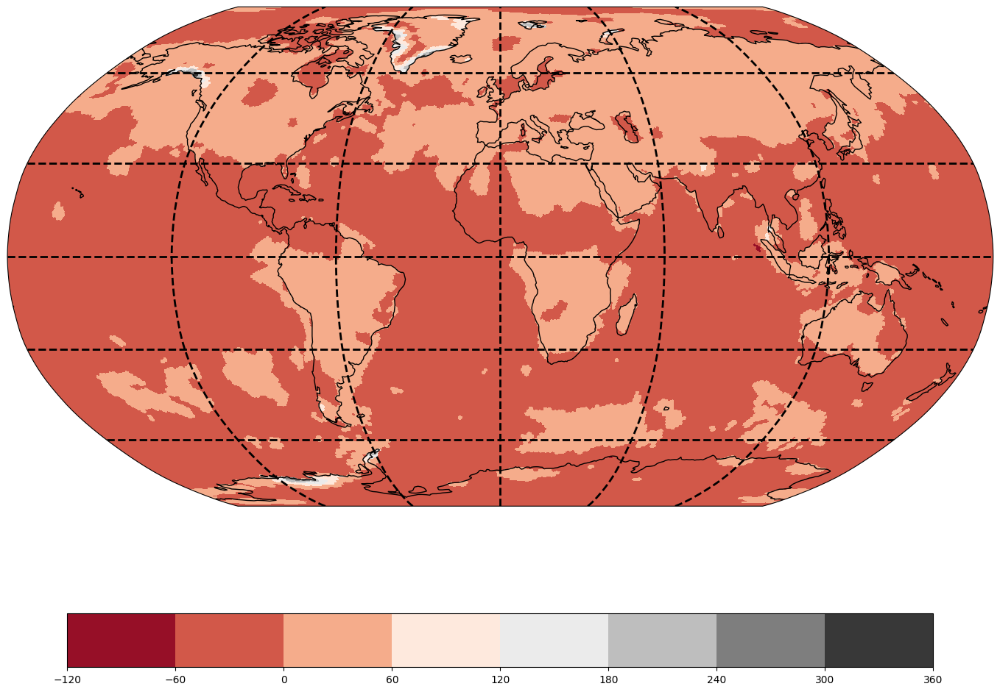

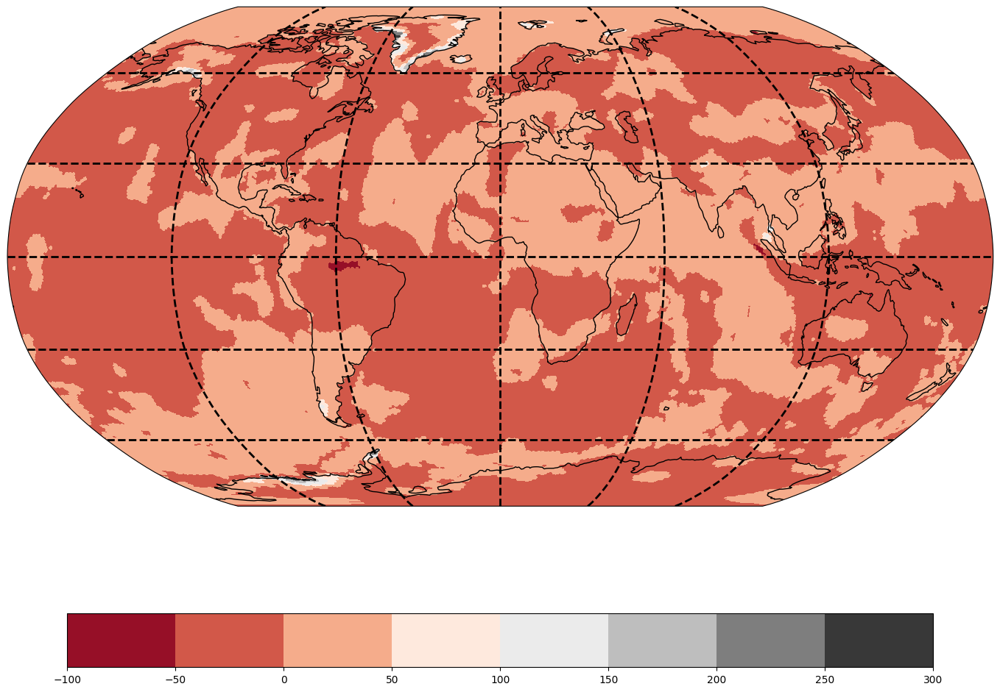

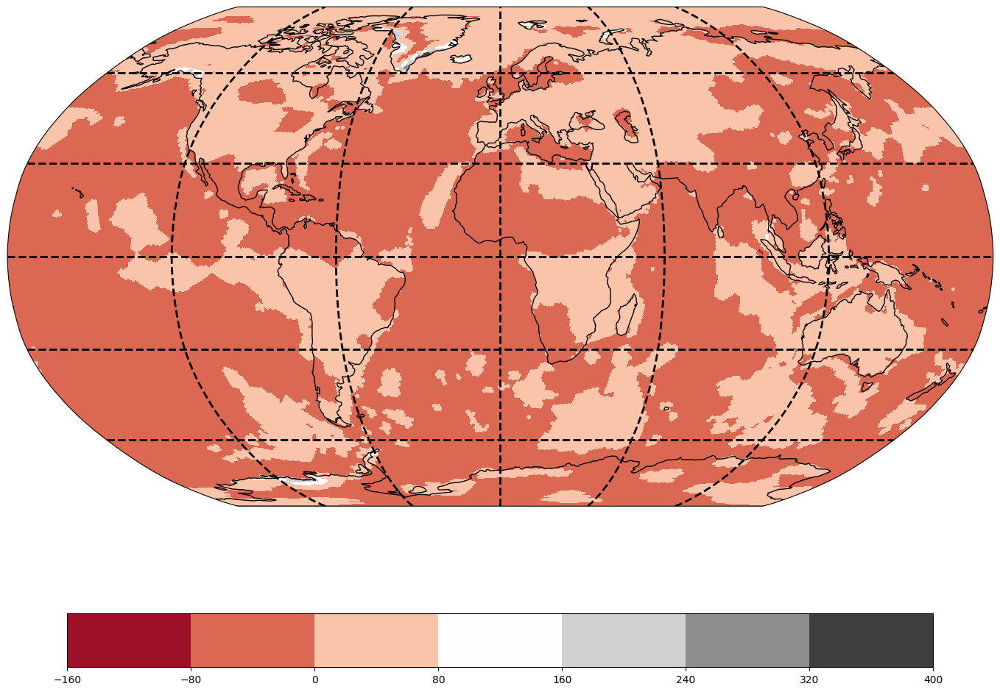

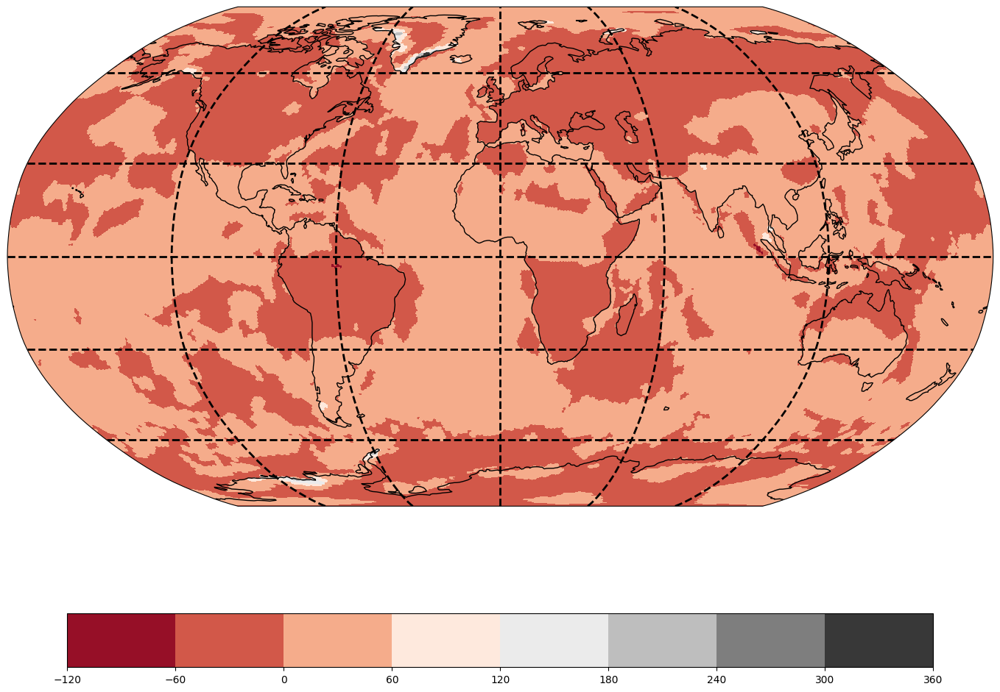

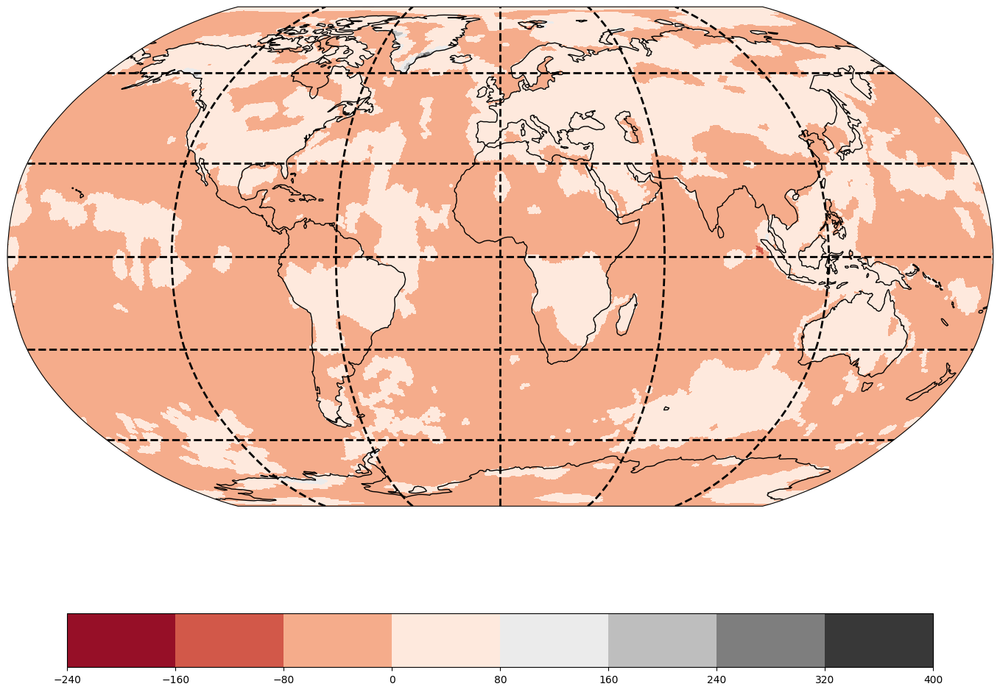

...

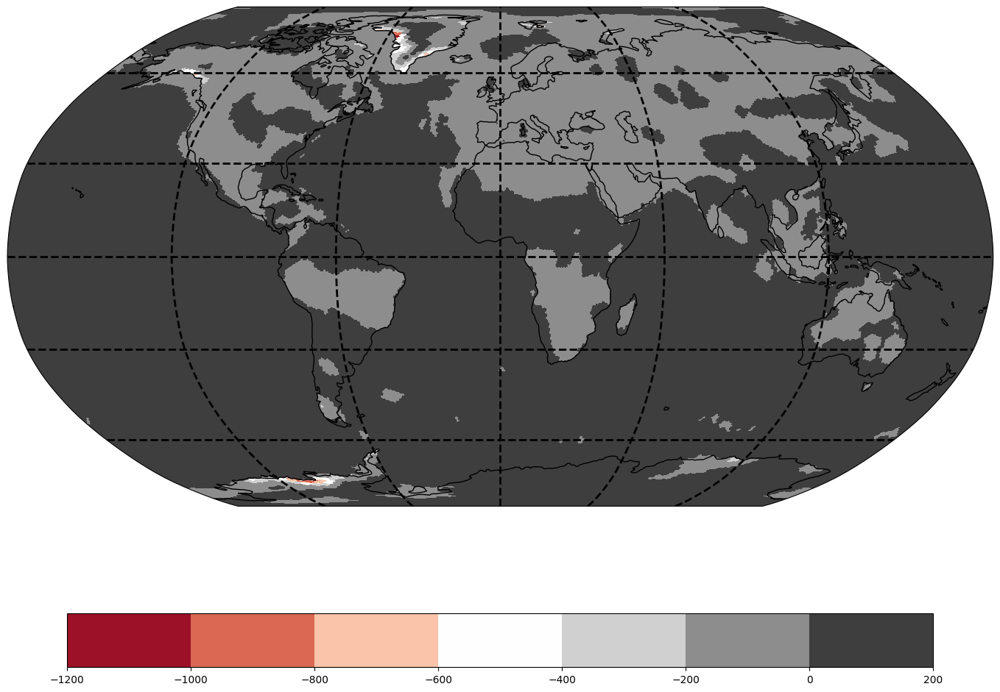

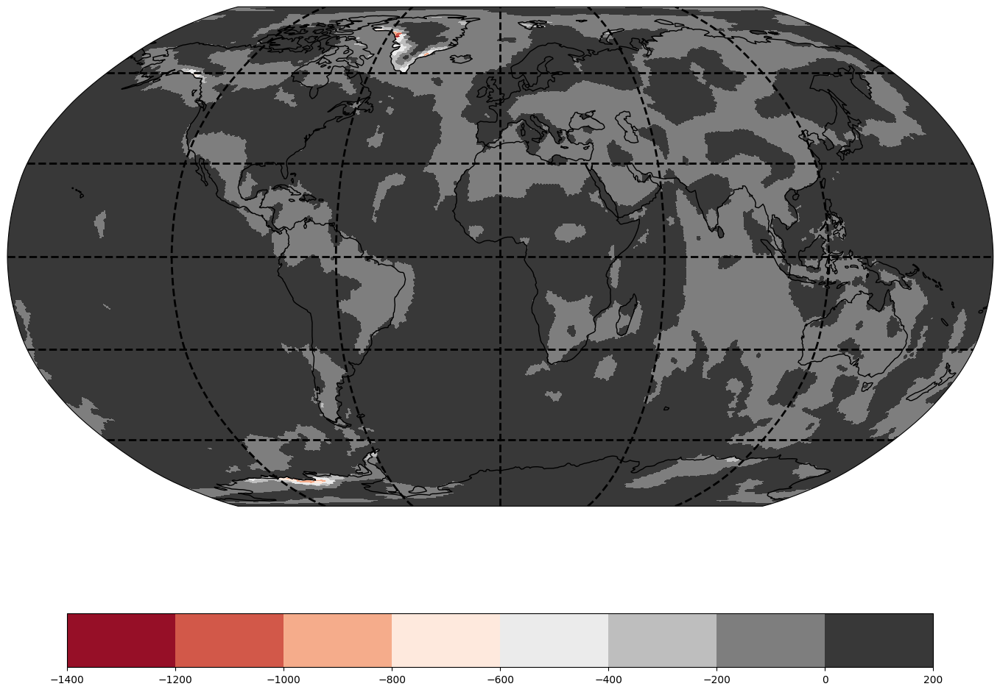

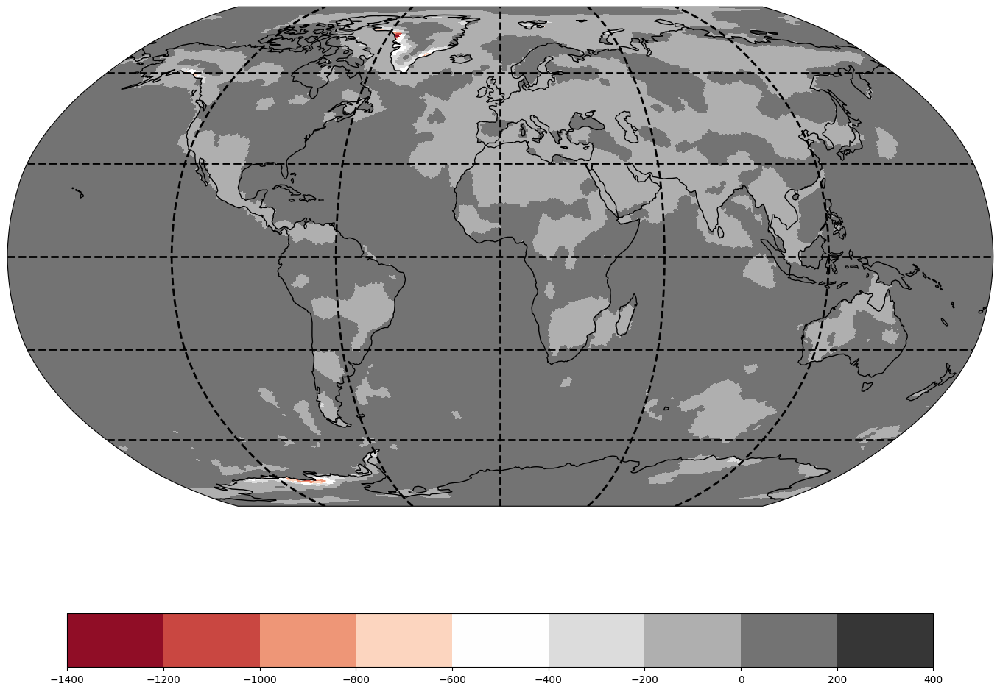

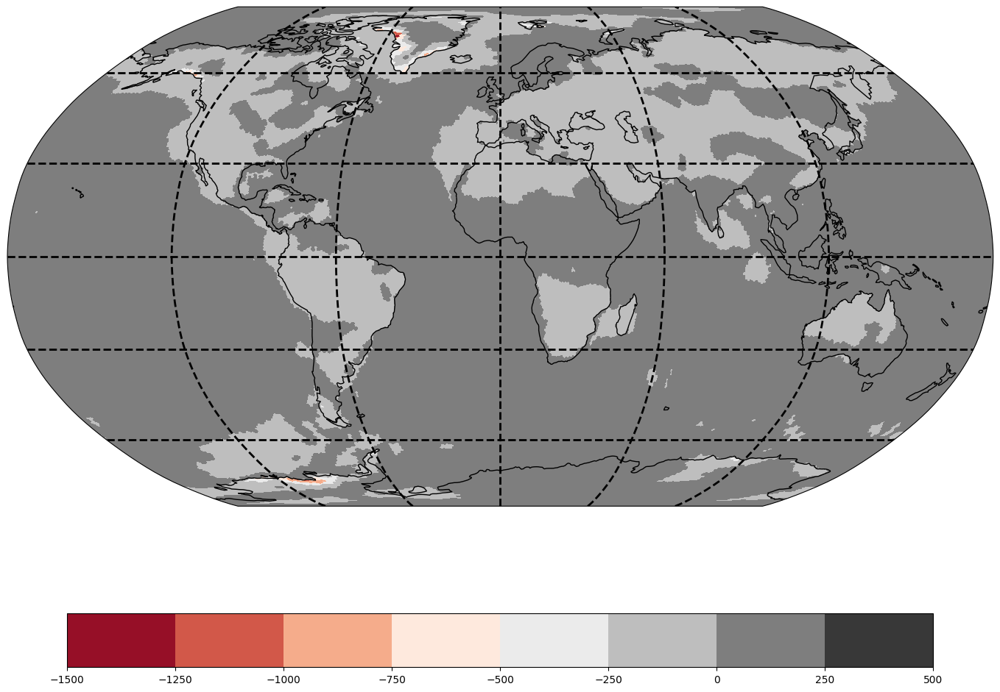

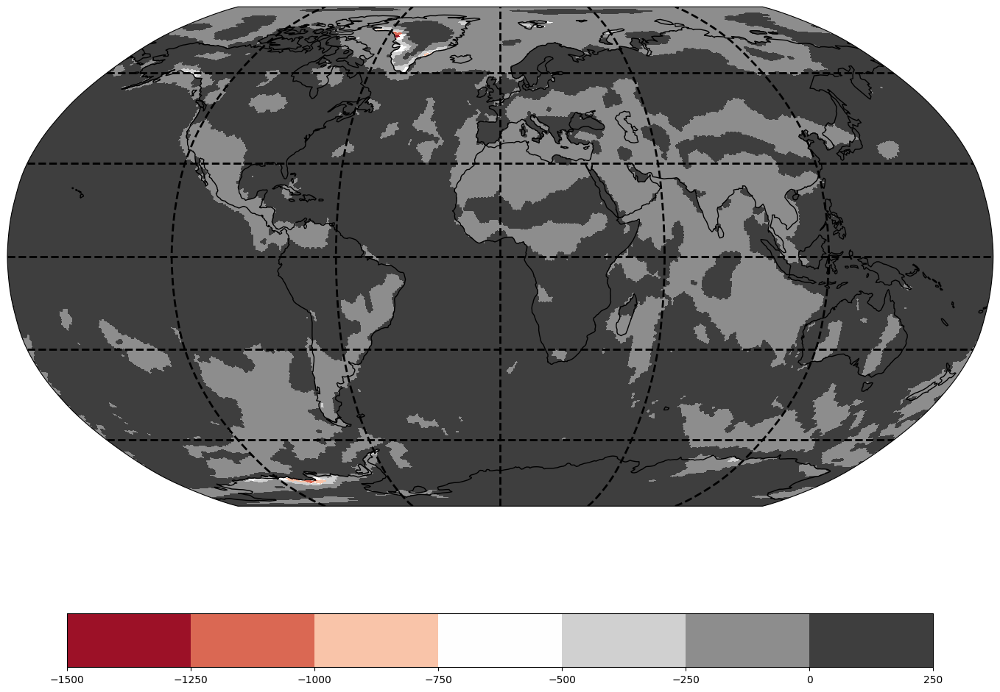

IndexError: index exceeds dimension bounds

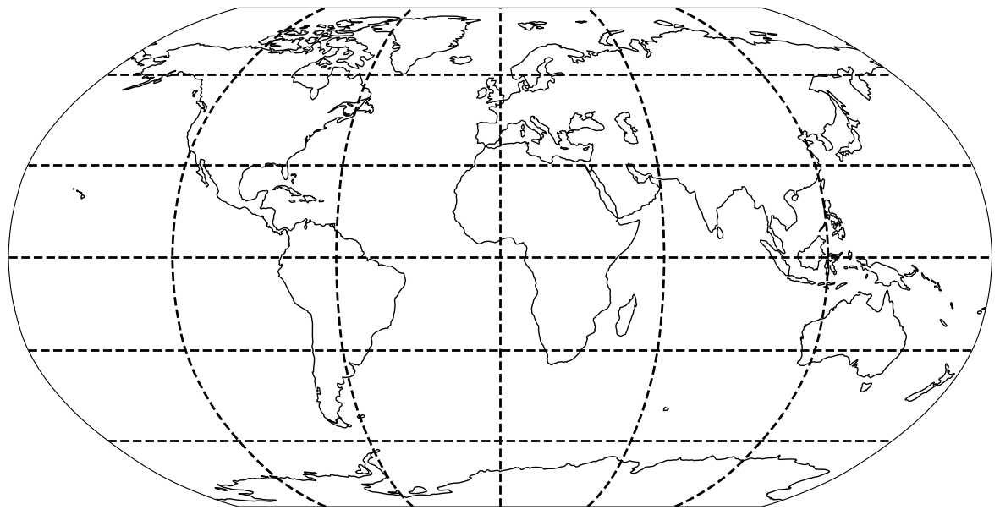

In [38]:
i_count = 0
TRANSFORMED_IMG = []

while i_count <= len(READ_CDF.variables["lwe_thickness"][:,0,0]):
    

    figure = plt.figure(figsize=(15,10))

    axis_func = plt.axes(projection=ccrs.Robinson())
    axis_func.set_global()
    axis_func.coastlines(resolution="110m",linewidth=1)
    axis_func.gridlines(linestyle='--',color='black',linewidth=2)

    plt.contourf(LON_DATA, LAT_DATA, READ_CDF.variables["lwe_thickness"][i_count*5,:,:], transform=ccrs.PlateCarree(),cmap="RdGy")
    color_bar_func = plt.colorbar(ax=axis_func, orientation="horizontal",aspect=16, shrink=0.8, extend="max")
    color_bar_func.ax.tick_params(labelsize=10)
    
    i_count = i_count + 1
    plt.savefig(f"IMG_RESULT_{i_count}.jpg")
    
    
    NEW_READING_IMG = cv2.cvtColor(cv2.imread(f"IMG_RESULT_{i_count}.jpg"),cv2.COLOR_BGR2RGB)
    TRANSFORMED_IMG.append(NEW_READING_IMG)
    
    plt.tight_layout()
    plt.show()

In [39]:
print(len(TRANSFORMED_IMG))

40


In [41]:
HTML(displaying_video(TRANSFORMED_IMG).to_html5_video())

In [42]:
MAIN_TARGET

,TIME,LAT,LON,LAT_THICKNESS,LON_THICKNESS,TOTAL_THICKNESS
0,107.0,-89.875,0.125,-2.468668,-2.468668,-4.937336
1,129.5,-89.625,0.375,-2.468668,-2.468668,-4.937336
2,227.5,-89.375,0.625,-3.255136,-2.468668,-5.723804
3,258.0,-89.125,0.875,-3.255136,-2.468668,-5.723804
4,288.5,-88.875,1.125,-3.255136,-2.468668,-5.723804
...,...,...,...,...,...,...
193,6985.0,-41.625,48.375,-0.807344,-2.468668,-3.276013
194,7014.5,-41.375,48.625,-1.277532,-2.468668,-3.746200
195,7045.0,-41.125,48.875,-1.277532,-2.468668,-3.746200
196,7075.5,-40.875,49.125,-1.277532,-2.468668,-3.746200


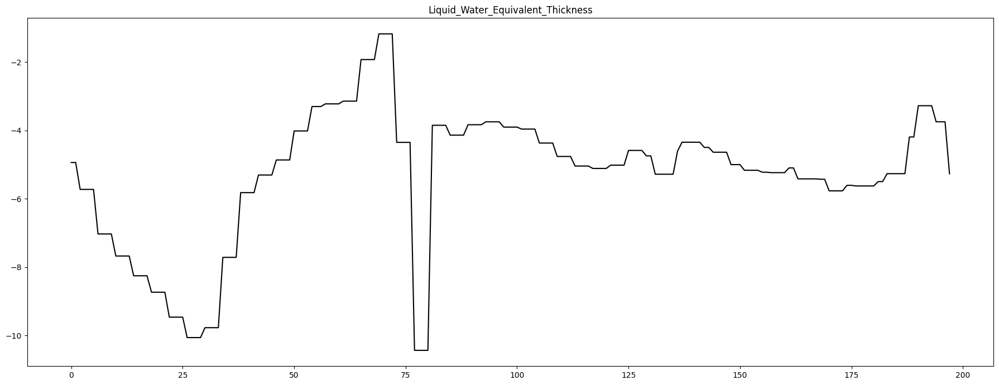

In [43]:
plt.figure(figsize=(18,7))
plt.title(READ_CDF.variables["lwe_thickness"].long_name)
plt.plot(MAIN_TARGET["TOTAL_THICKNESS"],color="black")
plt.tight_layout()
plt.show()

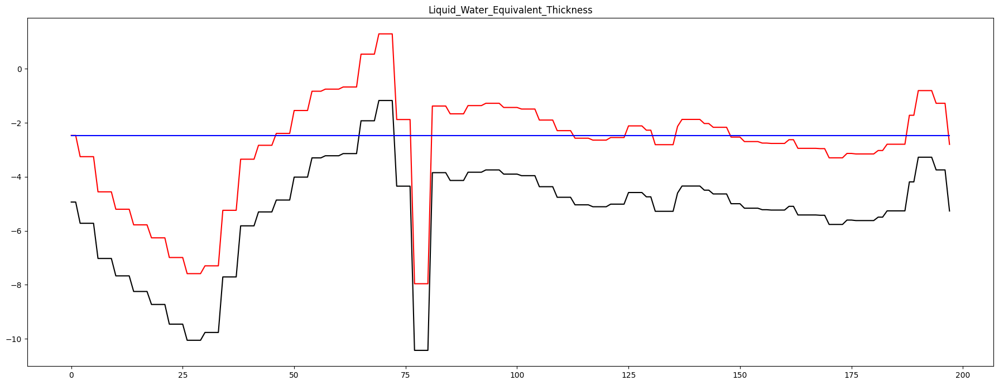

In [44]:
plt.figure(figsize=(18,7))
plt.title(READ_CDF.variables["lwe_thickness"].long_name)
plt.plot(MAIN_TARGET["TOTAL_THICKNESS"],color="black")
plt.plot(MAIN_TARGET["LAT_THICKNESS"],color="red")
plt.plot(MAIN_TARGET["LON_THICKNESS"],color="blue")
plt.tight_layout()
plt.show()

In [45]:
print(MAIN_TARGET[MAIN_TARGET["TOTAL_THICKNESS"] == MAIN_TARGET["TOTAL_THICKNESS"].max()])

      TIME     LAT     LON  LAT_THICKNESS  LON_THICKNESS  TOTAL_THICKNESS
69  2297.0 -72.625  17.375       1.294368      -2.468668          -1.1743
70  2327.5 -72.375  17.625       1.294368      -2.468668          -1.1743
71  2358.0 -72.125  17.875       1.294368      -2.468668          -1.1743
72  2388.5 -71.875  18.125       1.294368      -2.468668          -1.1743


In [46]:
print(MAIN_TARGET[MAIN_TARGET["TOTAL_THICKNESS"] == MAIN_TARGET["TOTAL_THICKNESS"].min()])

      TIME     LAT     LON  LAT_THICKNESS  LON_THICKNESS  TOTAL_THICKNESS
77  2541.5 -70.625  19.375      -7.963331      -2.468668       -10.431999
78  2572.5 -70.375  19.625      -7.963331      -2.468668       -10.431999
79  2602.0 -70.125  19.875      -7.963331      -2.468668       -10.431999
80  2631.5 -69.875  20.125      -7.963331      -2.468668       -10.431999


In [48]:
import folium

# Create the map with an attribution for the 'Stamen Terrain' tileset
MAP_FUNCTION = folium.Map(location=[1.9637, 35.2433],
                          tiles='Stamen Terrain',
                          zoom_start=2.0,
                          attr="Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL.")

# Add Circle Markers
folium.CircleMarker(
    location=[-70.625, 19.375],
    radius=20,
    popup="<b>MIN 1<b>",
    tooltip="Click me",
    color='#2F4F4F',
    fill=True,
    fill_color='red',
).add_to(MAP_FUNCTION)

folium.CircleMarker(
    location=[-70.375, 19.625],
    radius=20,
    popup="<b>MIN 2<b>",
    tooltip="Click me",
    color='#2F4F4F',
    fill=True,
    fill_color='green',
).add_to(MAP_FUNCTION)

folium.CircleMarker(
    location=[-70.125, 19.875],
    radius=20,
    popup="<b>MIN 3<b>",
    tooltip="Click me",
    color='#2F4F4F',
    fill=True,
    fill_color='blue',
).add_to(MAP_FUNCTION)

folium.CircleMarker(
    location=[-69.875, 20.125],
    radius=20,
    popup="<b>MIN 4<b>",
    tooltip="Click me",
    color='#2F4F4F',
    fill=True,
    fill_color='black',
).add_to(MAP_FUNCTION)

# Display the map
MAP_FUNCTION


In [50]:
import folium

# Create the map with an attribution for the 'Stamen Terrain' tileset
MAP_FUNCTION = folium.Map(location=[1.9637, 35.2433],
                          tiles='Stamen Terrain',
                          zoom_start=2.0,
                          attr="Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL.")

# Add Circle Markers
folium.CircleMarker(
    location=[-72.625, 17.375],
    radius=20,
    popup="<b>MAX 1<b>",
    tooltip="Click me",
    color='#2F4F4F',
    fill=True,
    fill_color='red',
).add_to(MAP_FUNCTION)

folium.CircleMarker(
    location=[-72.375, 17.625],
    radius=20,
    popup="<b>MAX 2<b>",
    tooltip="Click me",
    color='#2F4F4F',
    fill=True,
    fill_color='green',
).add_to(MAP_FUNCTION)

folium.CircleMarker(
    location=[-72.125, 17.875],
    radius=20,
    popup="<b>MAX 3<b>",
    tooltip="Click me",
    color='#2F4F4F',
    fill=True,
    fill_color='blue',
).add_to(MAP_FUNCTION)

folium.CircleMarker(
    location=[-71.875, 18.125],
    radius=20,
    popup="<b>MAX 4<b>",
    tooltip="Click me",
    color='#2F4F4F',
    fill=True,
    fill_color='black',
).add_to(MAP_FUNCTION)

# Display the map
MAP_FUNCTION


<Figure size 1500x1000 with 0 Axes>

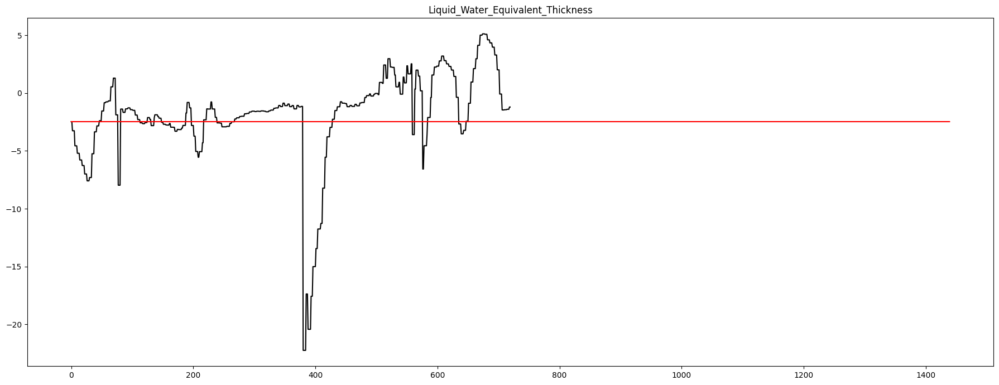

<Figure size 1500x1000 with 0 Axes>

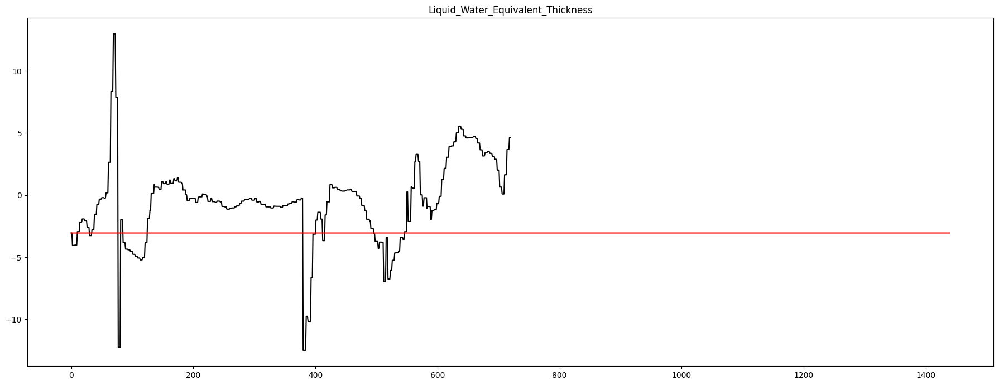

<Figure size 1500x1000 with 0 Axes>

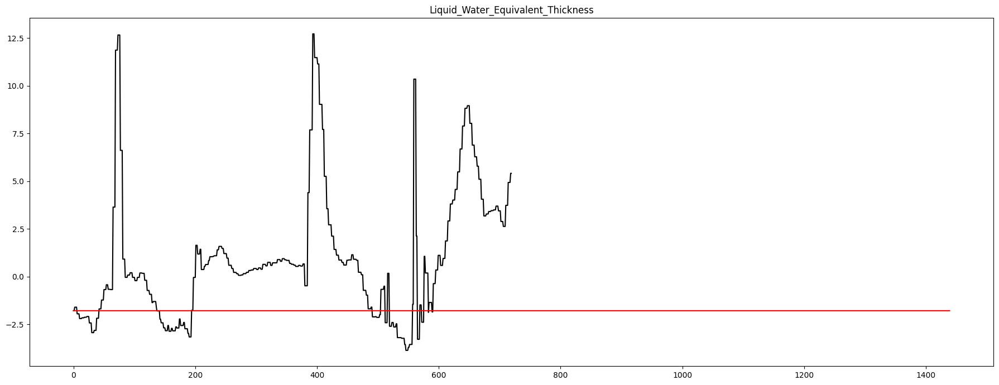

<Figure size 1500x1000 with 0 Axes>

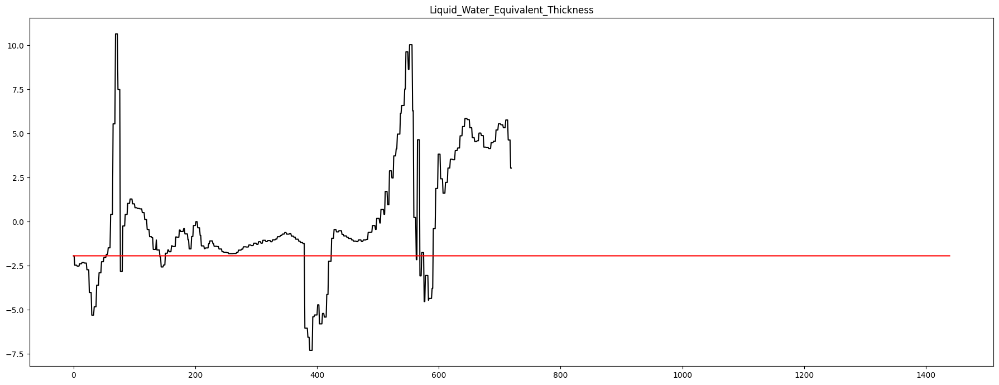

<Figure size 1500x1000 with 0 Axes>

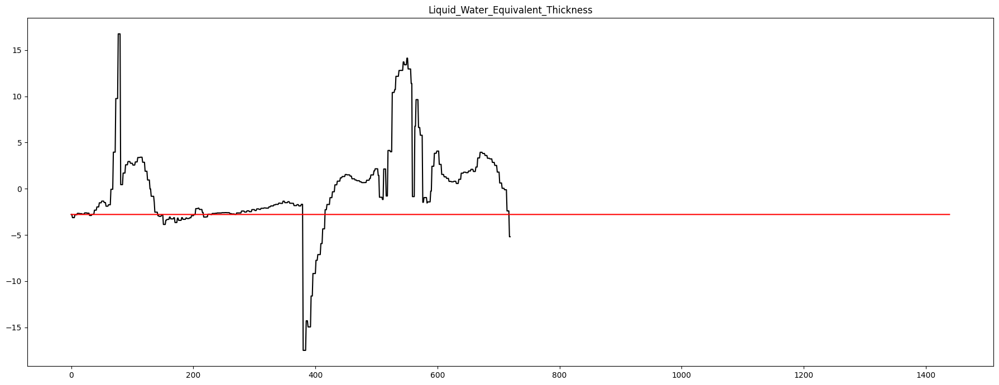

<Figure size 1500x1000 with 0 Axes>

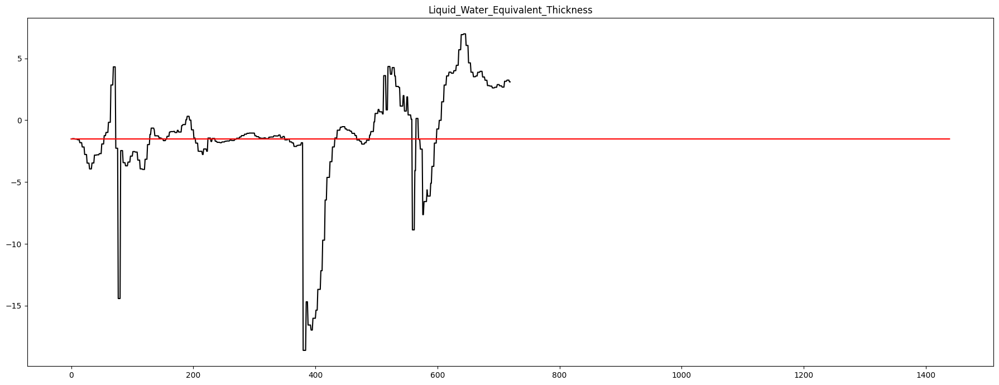

<Figure size 1500x1000 with 0 Axes>

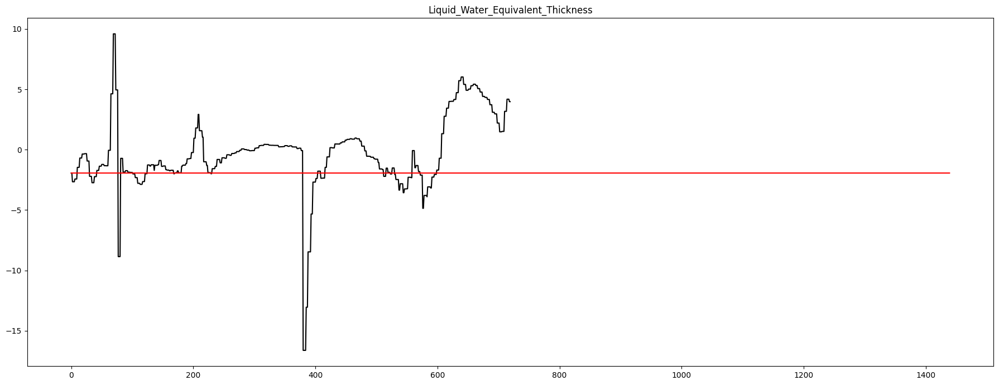

<Figure size 1500x1000 with 0 Axes>

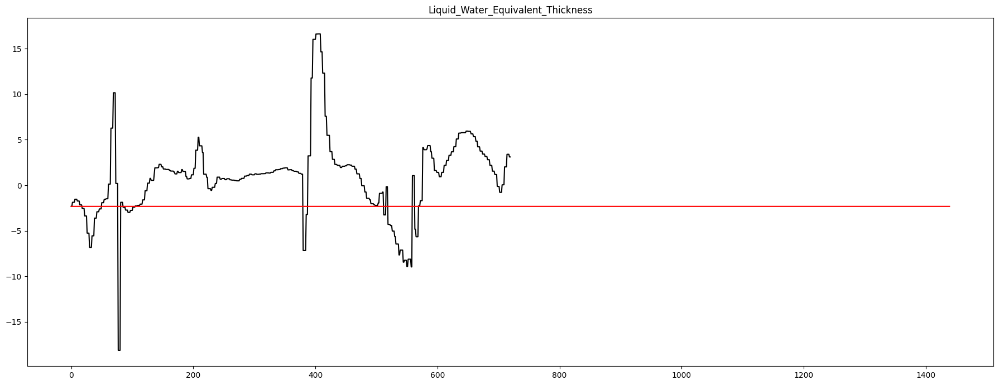

<Figure size 1500x1000 with 0 Axes>

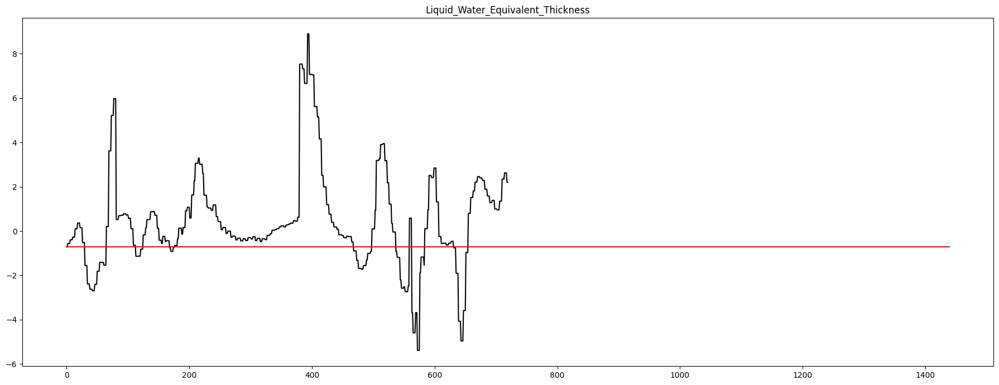

<Figure size 1500x1000 with 0 Axes>

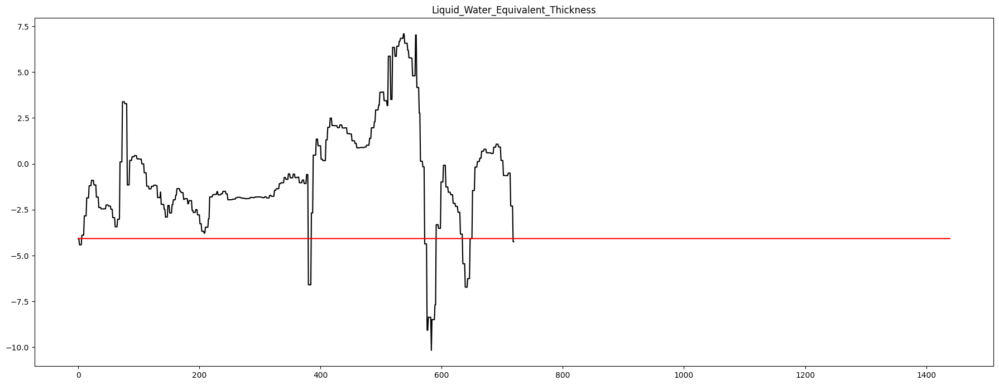

<Figure size 1500x1000 with 0 Axes>

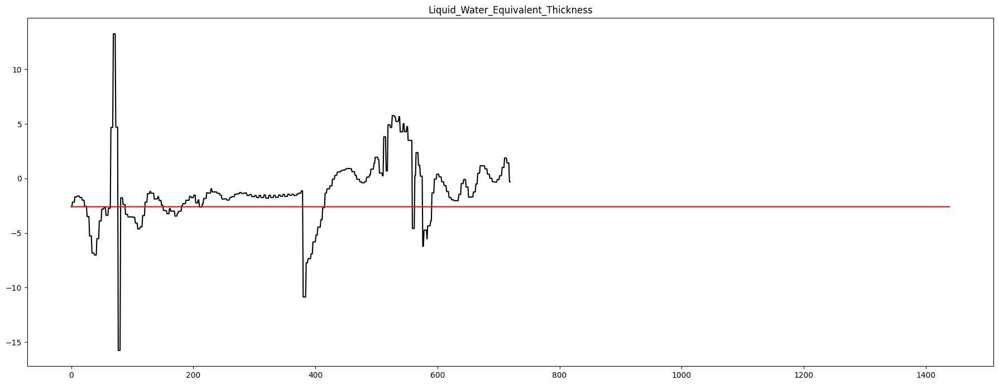

<Figure size 1500x1000 with 0 Axes>

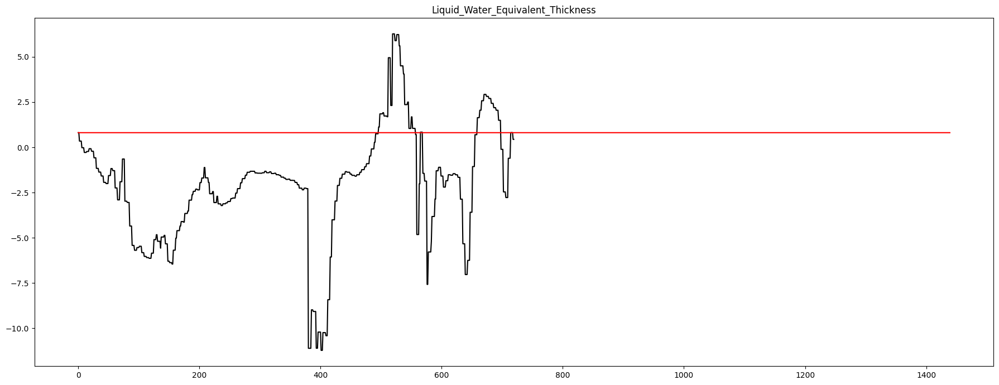

<Figure size 1500x1000 with 0 Axes>

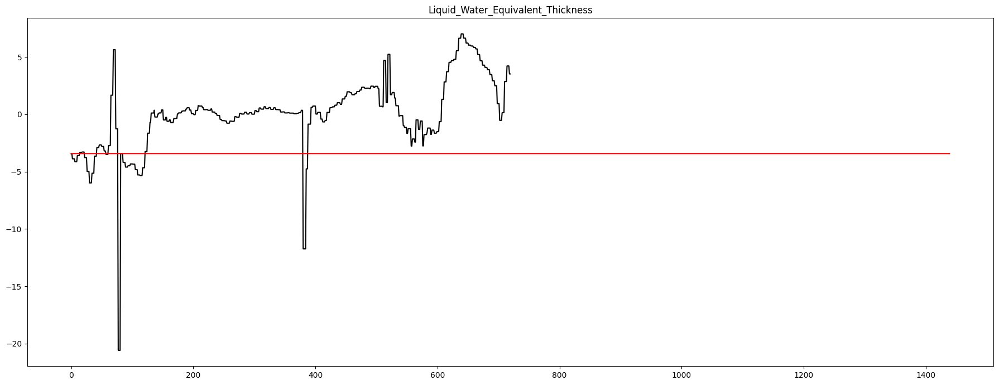

<Figure size 1500x1000 with 0 Axes>

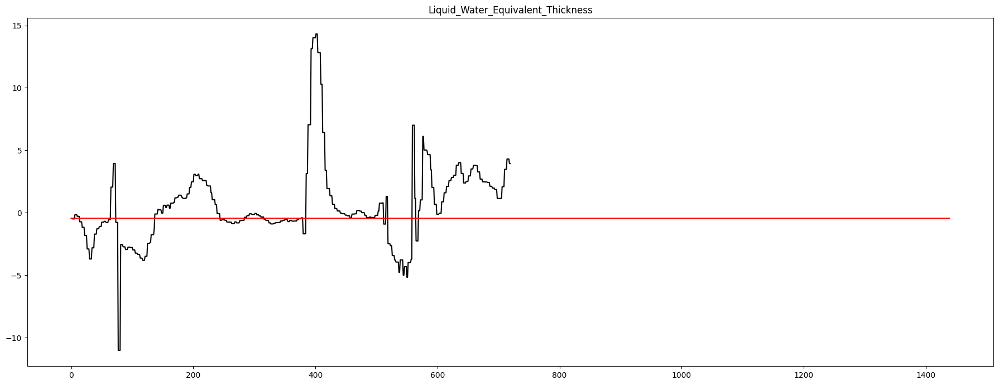

<Figure size 1500x1000 with 0 Axes>

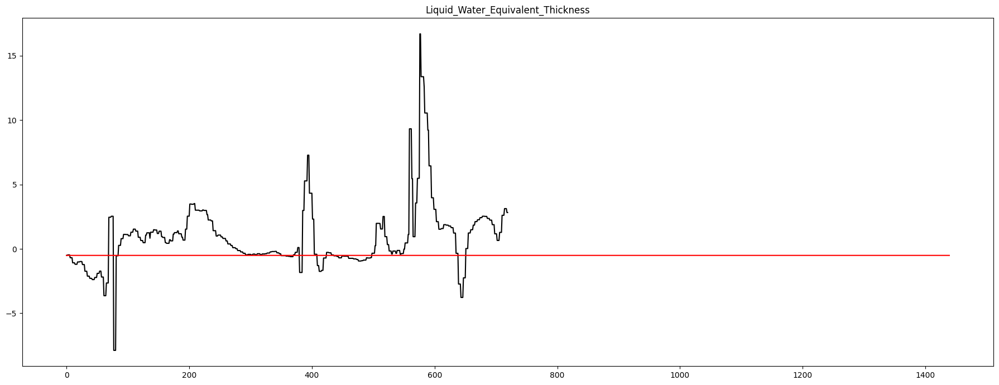

<Figure size 1500x1000 with 0 Axes>

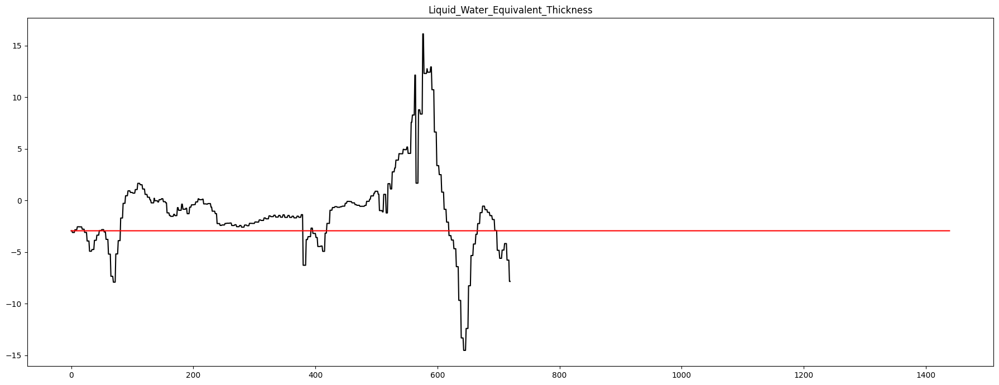

<Figure size 1500x1000 with 0 Axes>

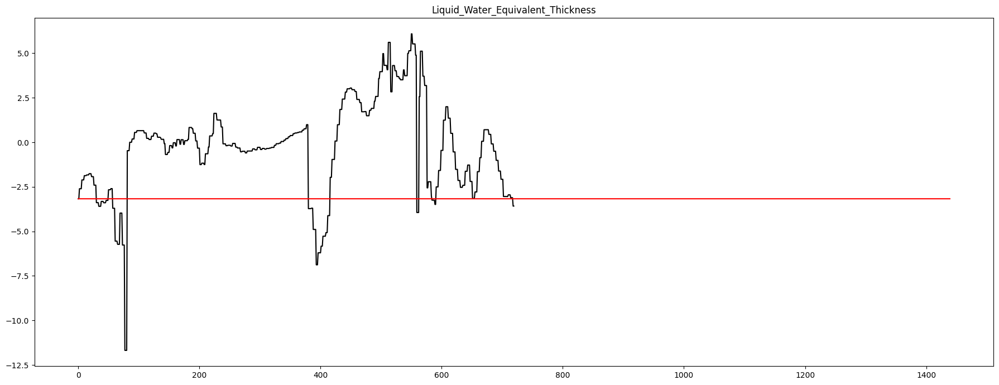

<Figure size 1500x1000 with 0 Axes>

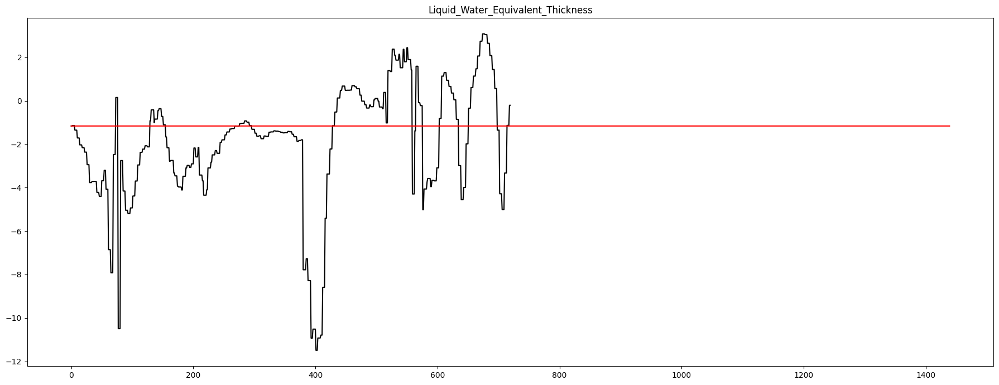

<Figure size 1500x1000 with 0 Axes>

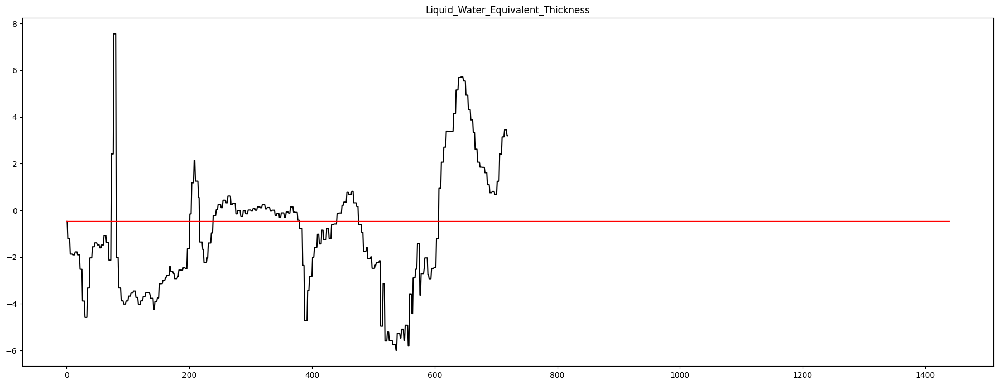

<Figure size 1500x1000 with 0 Axes>

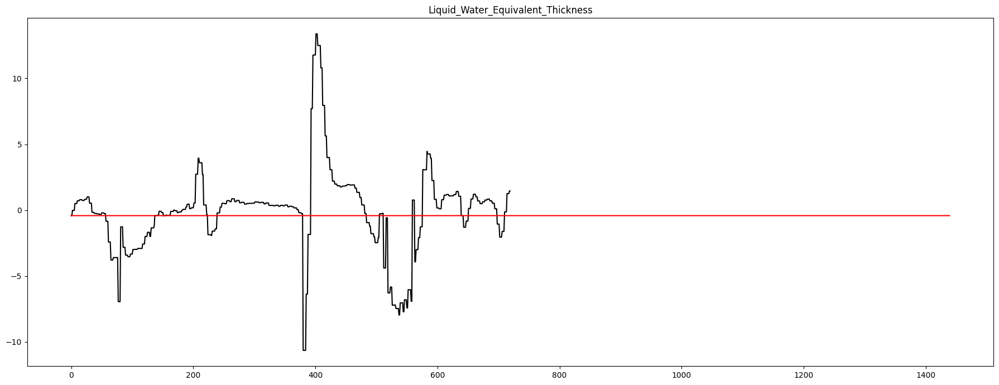

<Figure size 1500x1000 with 0 Axes>

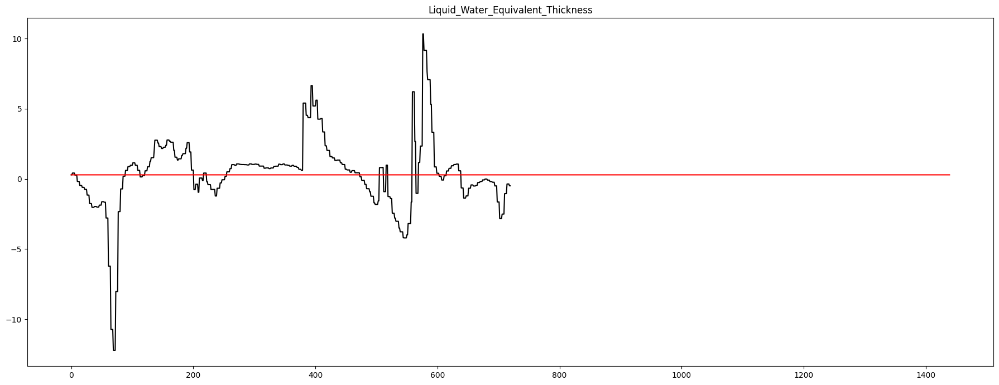

<Figure size 1500x1000 with 0 Axes>

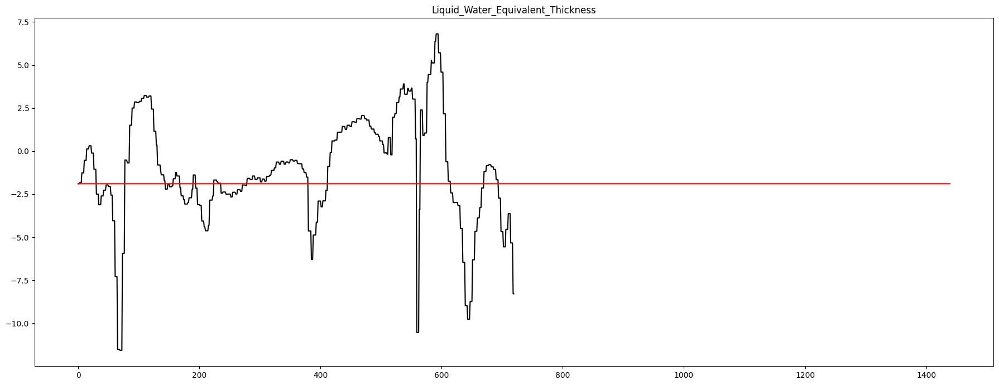

<Figure size 1500x1000 with 0 Axes>

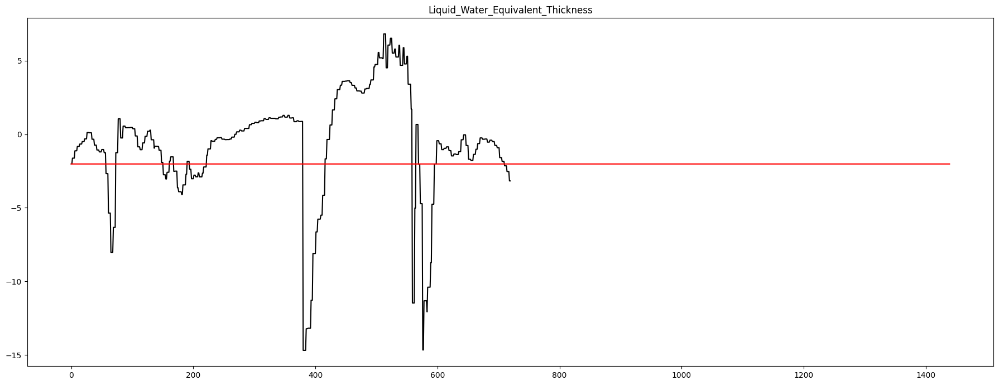

<Figure size 1500x1000 with 0 Axes>

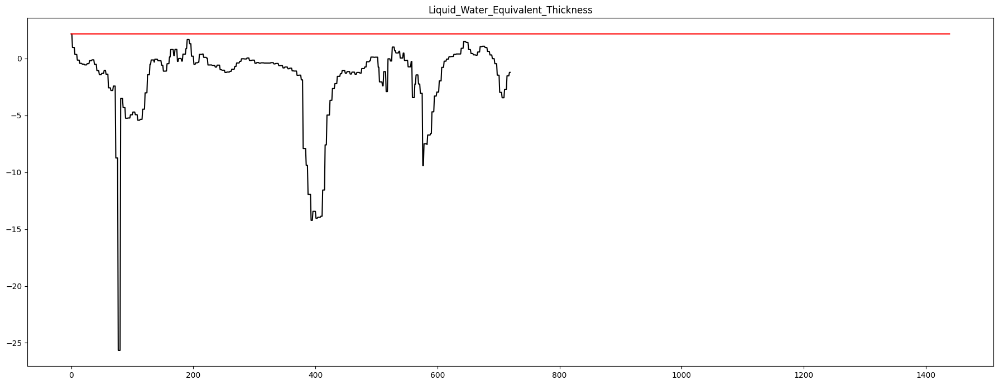

<Figure size 1500x1000 with 0 Axes>

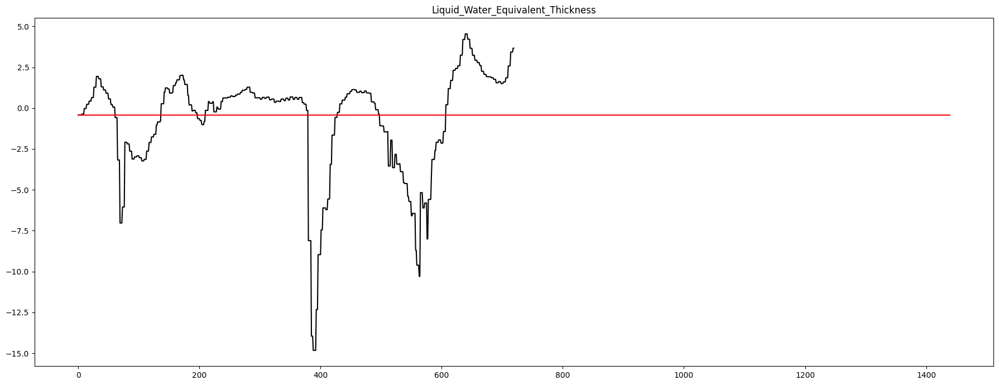

<Figure size 1500x1000 with 0 Axes>

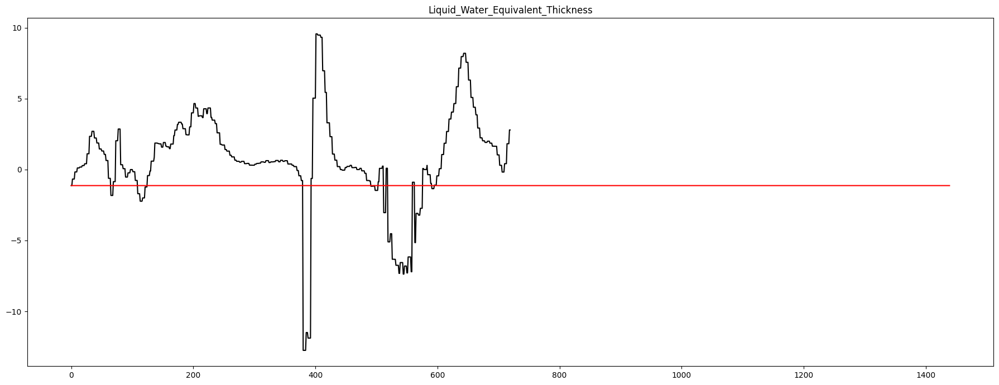

<Figure size 1500x1000 with 0 Axes>

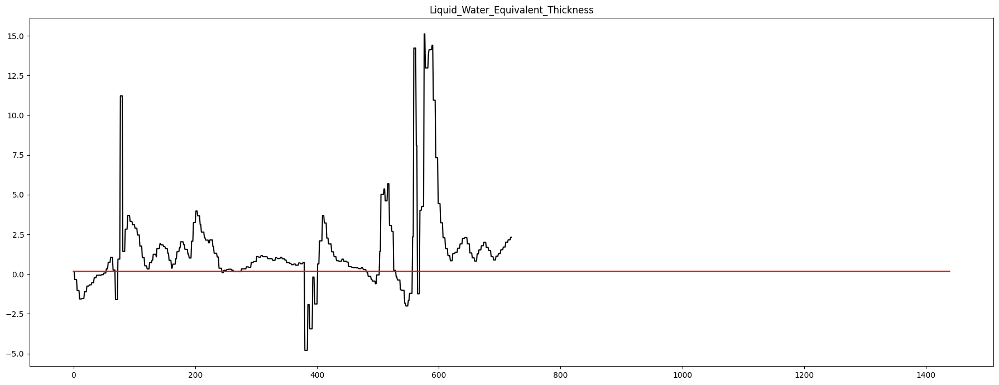

<Figure size 1500x1000 with 0 Axes>

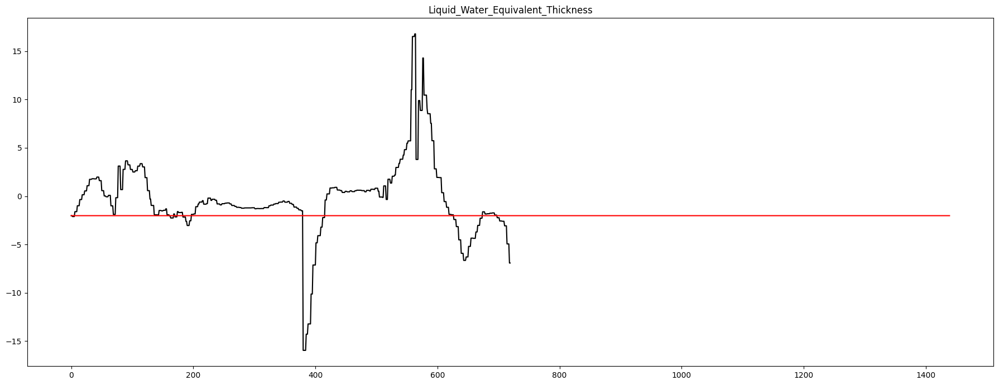

<Figure size 1500x1000 with 0 Axes>

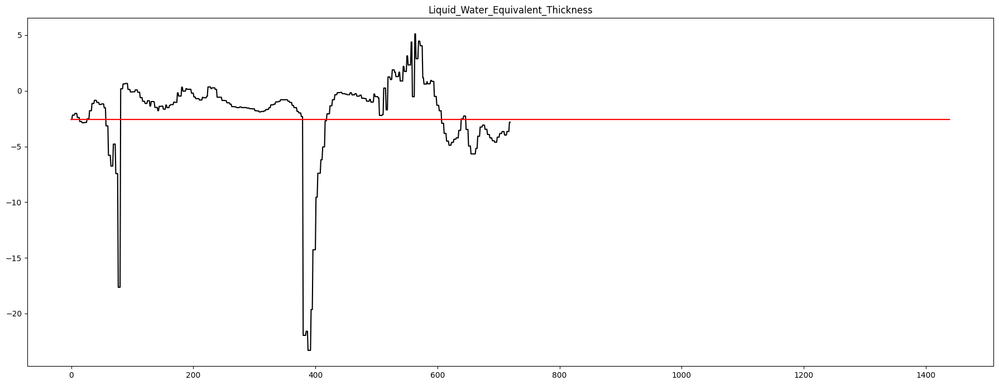

<Figure size 1500x1000 with 0 Axes>

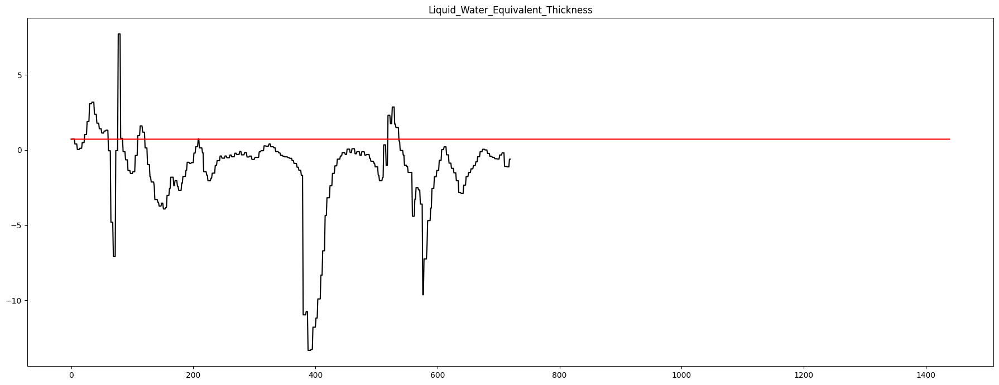

<Figure size 1500x1000 with 0 Axes>

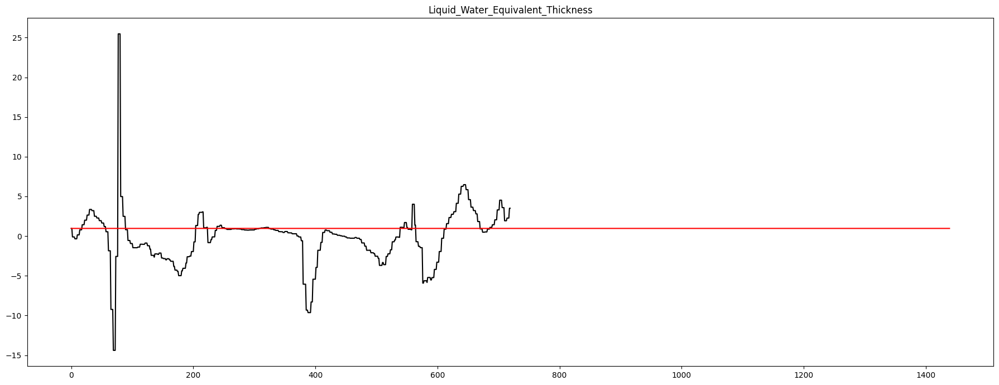

<Figure size 1500x1000 with 0 Axes>

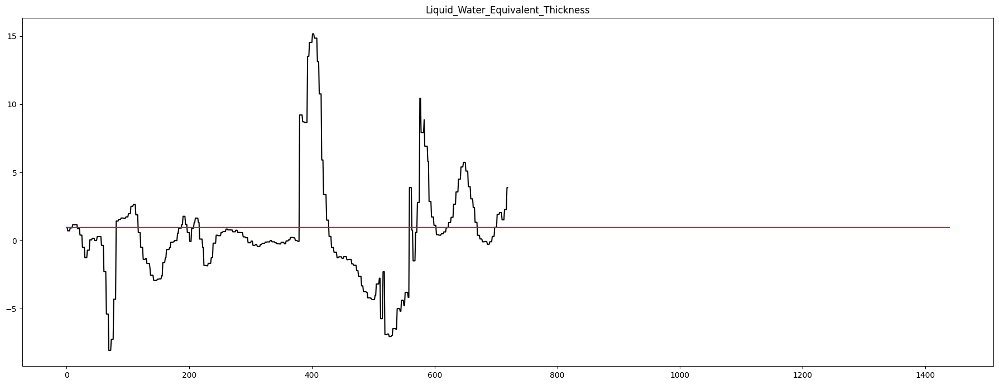

<Figure size 1500x1000 with 0 Axes>

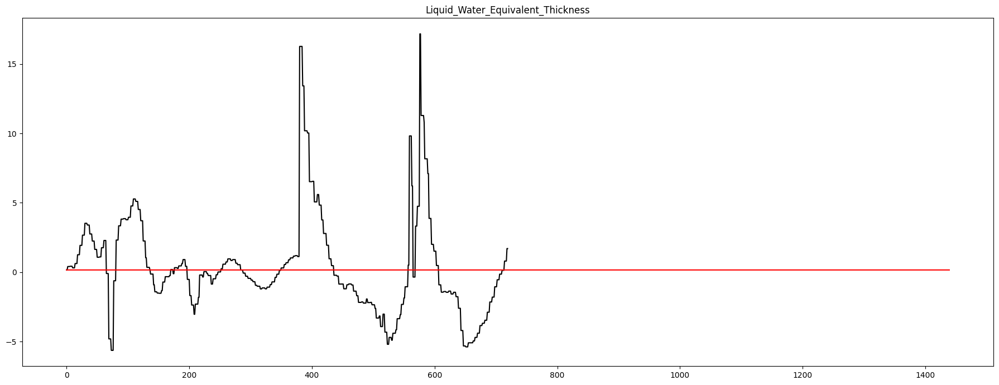

<Figure size 1500x1000 with 0 Axes>

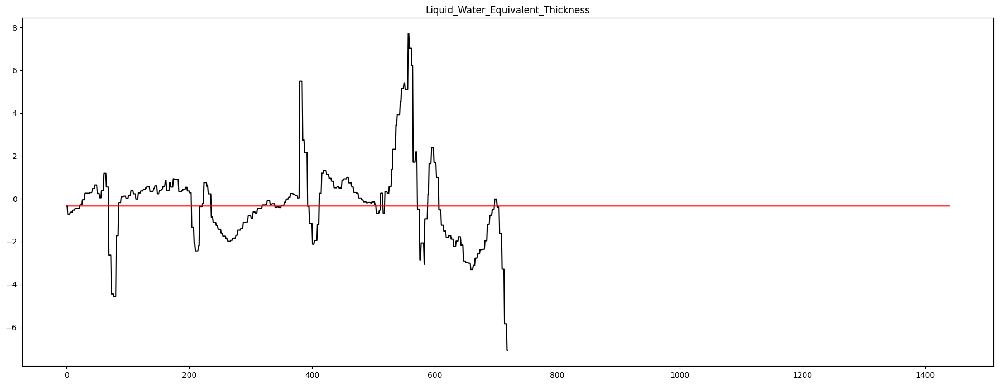

<Figure size 1500x1000 with 0 Axes>

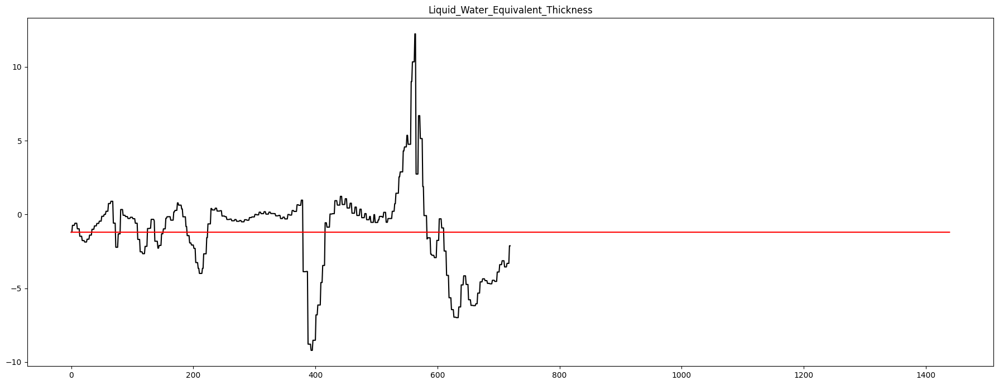

<Figure size 1500x1000 with 0 Axes>

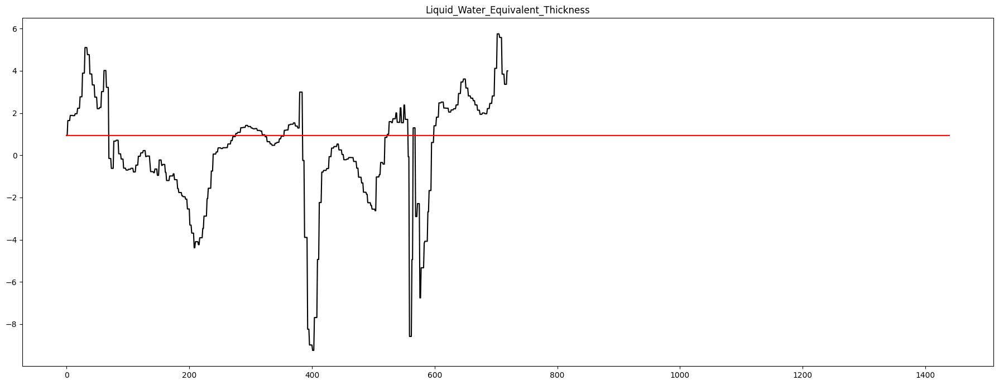

<Figure size 1500x1000 with 0 Axes>

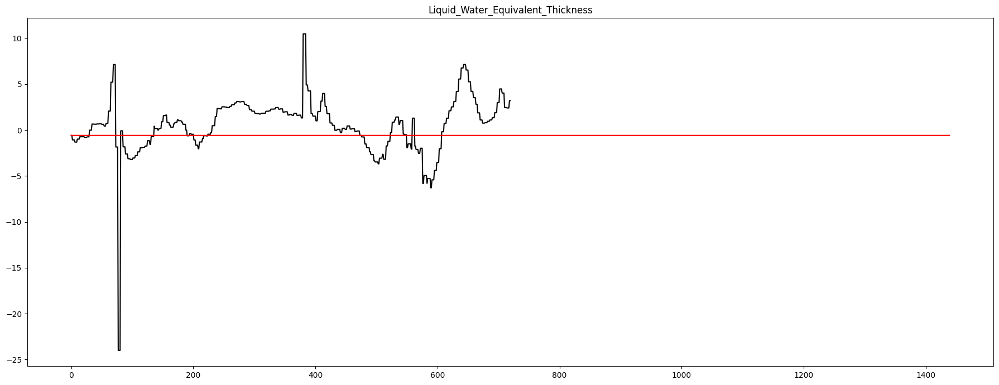

<Figure size 1500x1000 with 0 Axes>

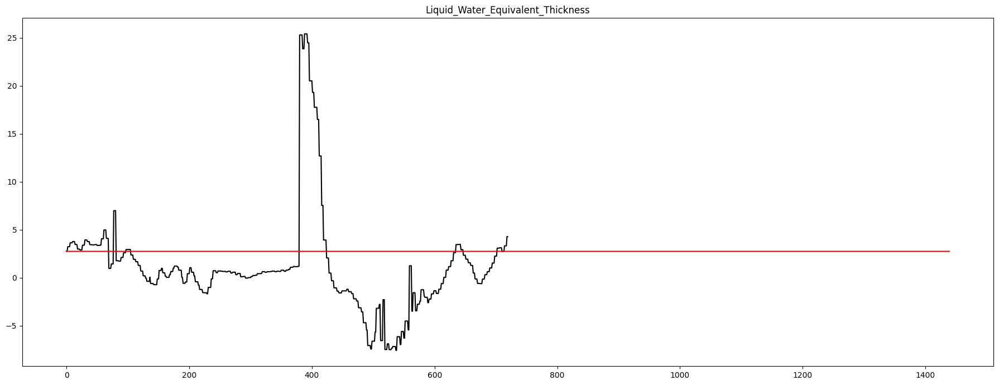

<Figure size 1500x1000 with 0 Axes>

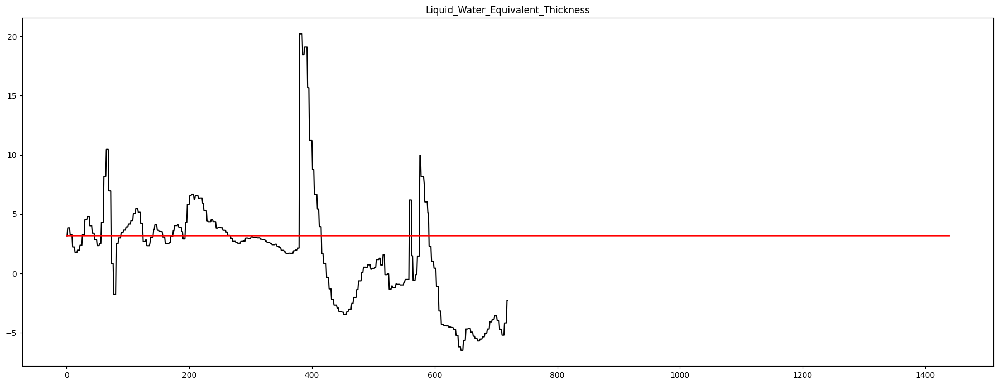

<Figure size 1500x1000 with 0 Axes>

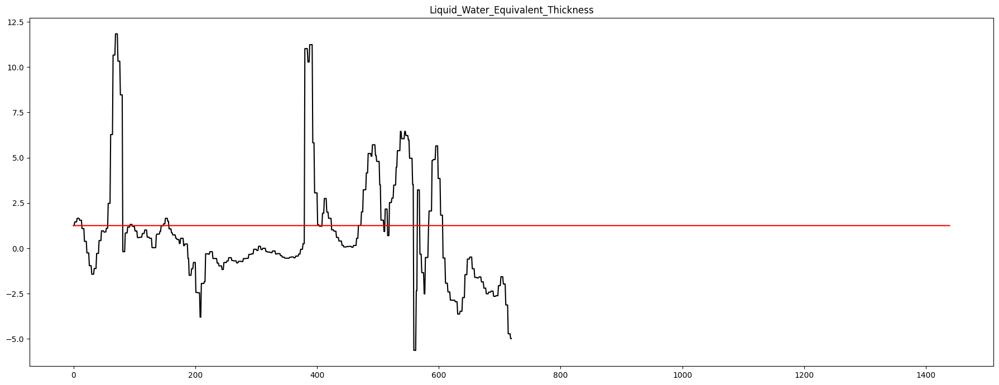

<Figure size 1500x1000 with 0 Axes>

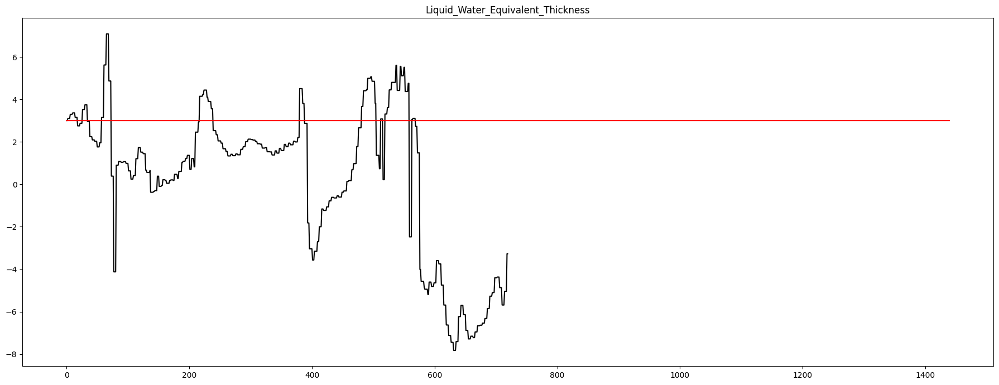

<Figure size 1500x1000 with 0 Axes>

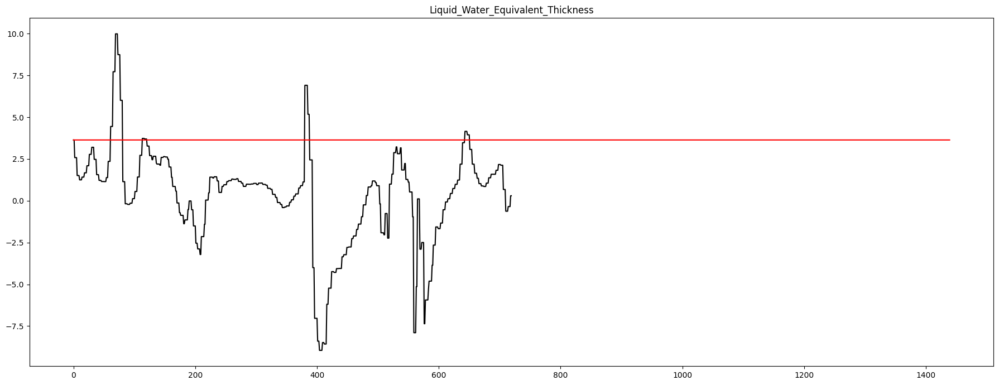

<Figure size 1500x1000 with 0 Axes>

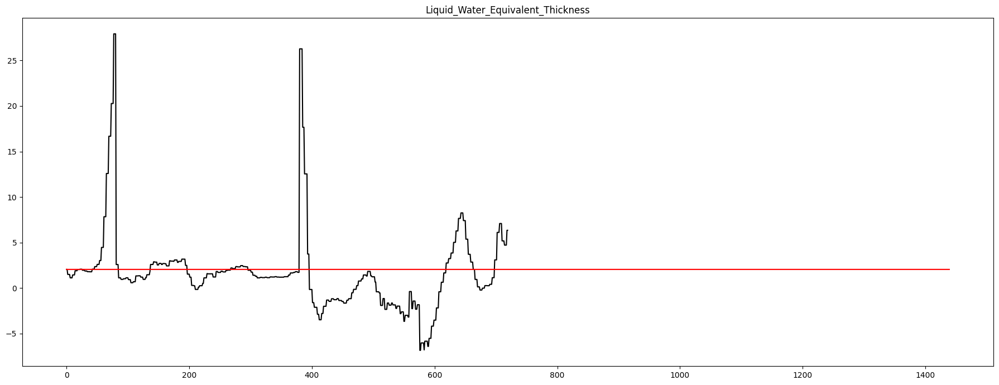

<Figure size 1500x1000 with 0 Axes>

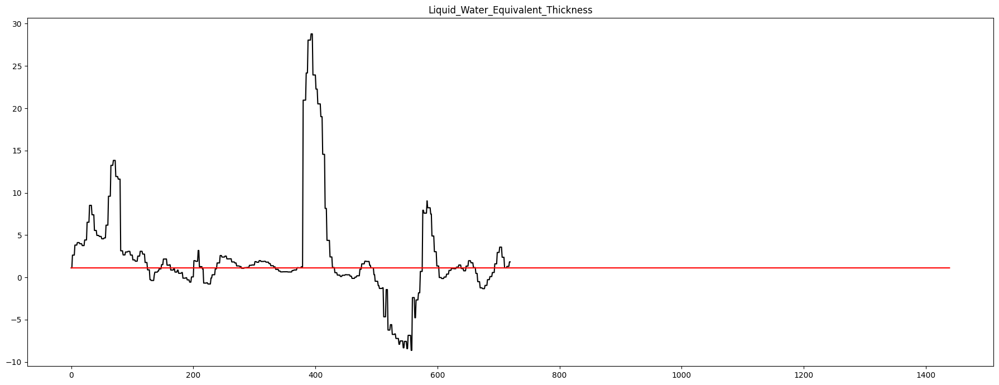

<Figure size 1500x1000 with 0 Axes>

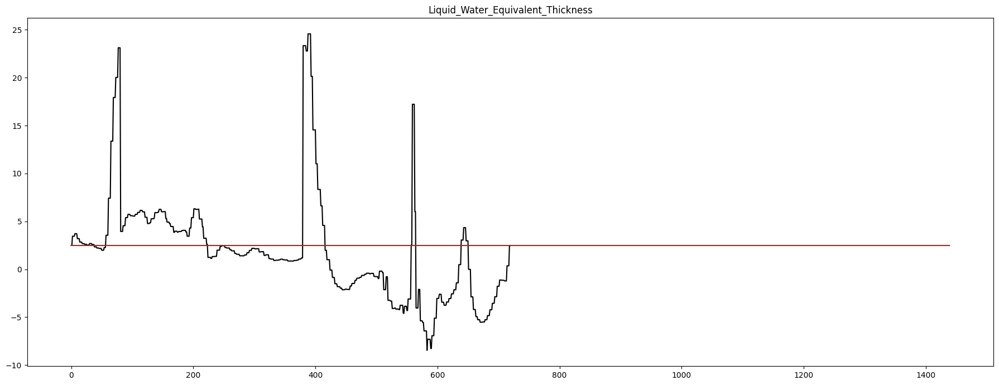

<Figure size 1500x1000 with 0 Axes>

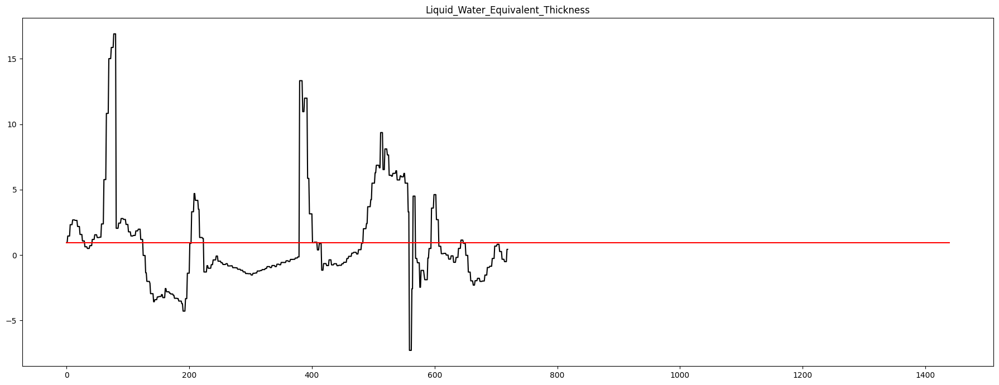

<Figure size 1500x1000 with 0 Axes>

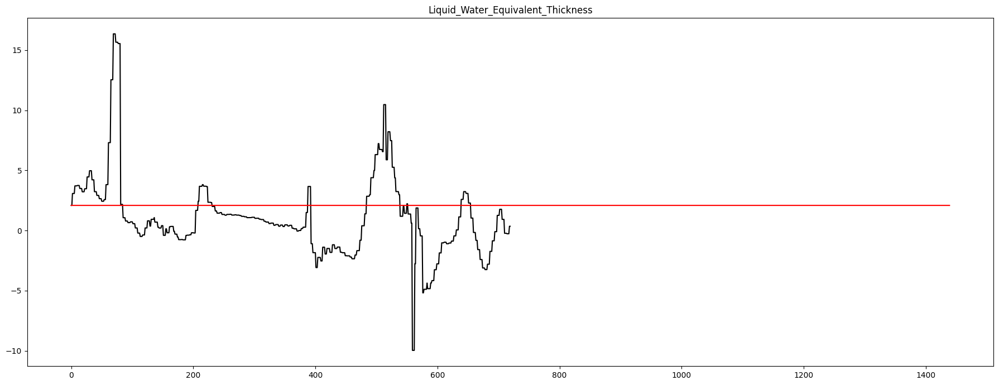

<Figure size 1500x1000 with 0 Axes>

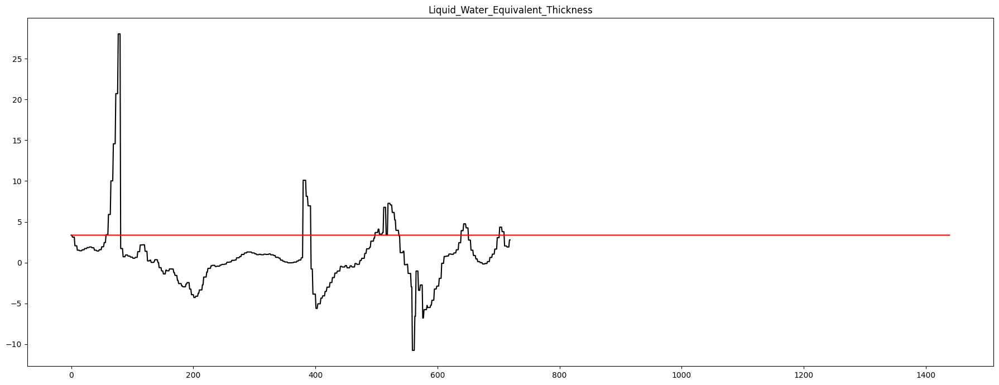

<Figure size 1500x1000 with 0 Axes>

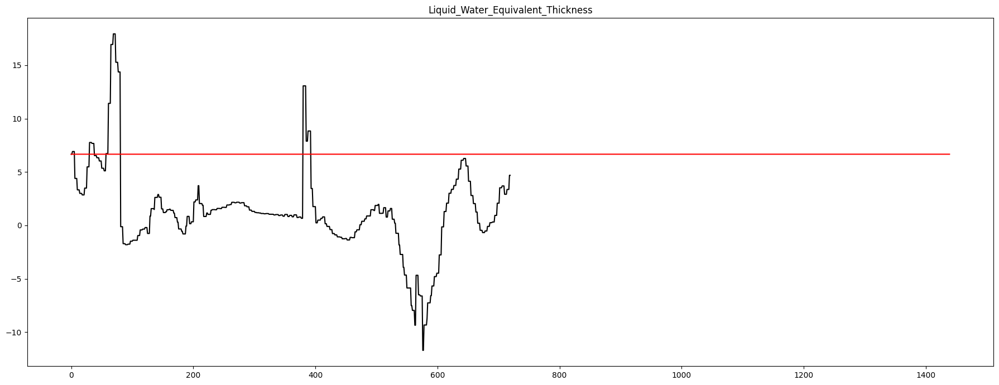

<Figure size 1500x1000 with 0 Axes>

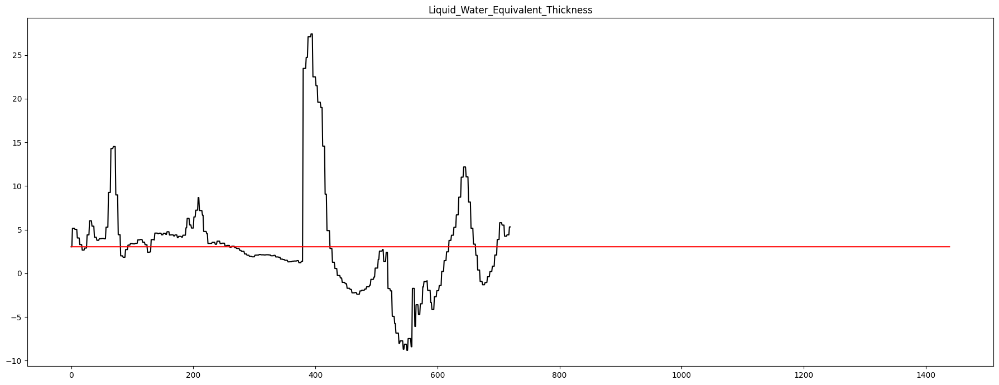

<Figure size 1500x1000 with 0 Axes>

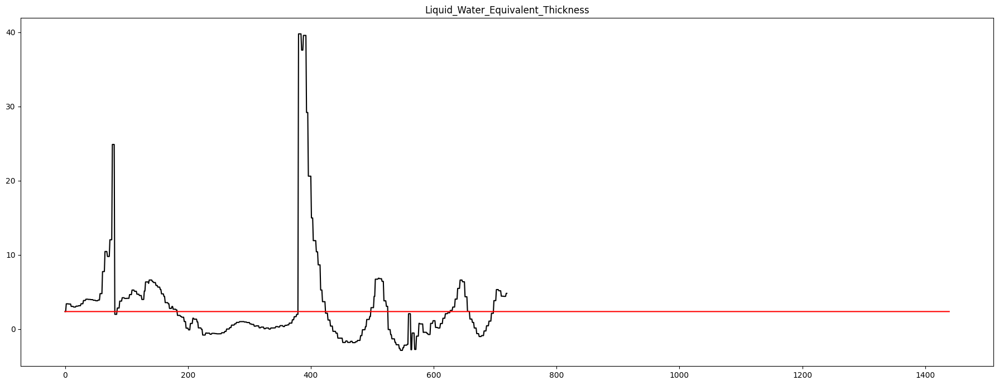

<Figure size 1500x1000 with 0 Axes>

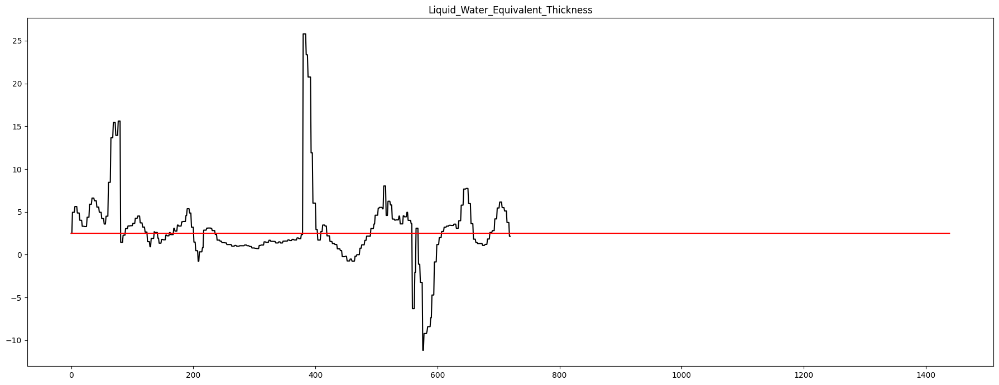

<Figure size 1500x1000 with 0 Axes>

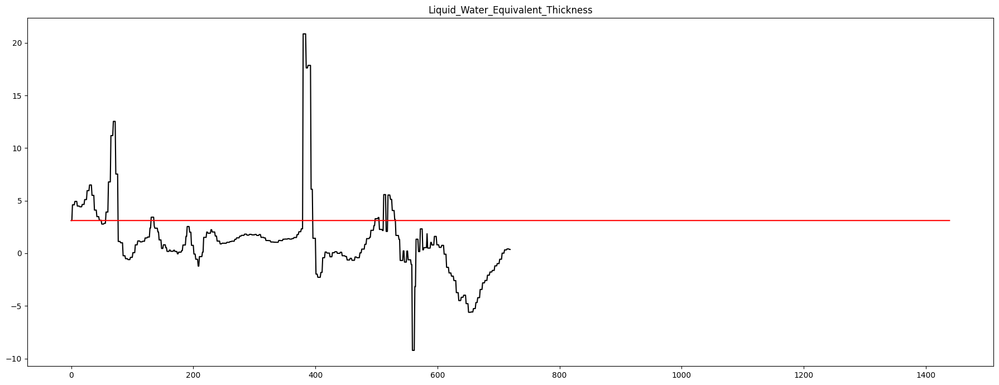

<Figure size 1500x1000 with 0 Axes>

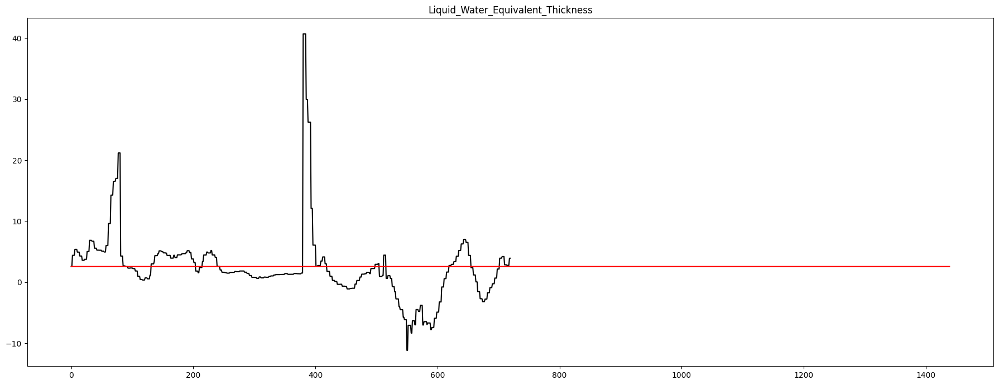

<Figure size 1500x1000 with 0 Axes>

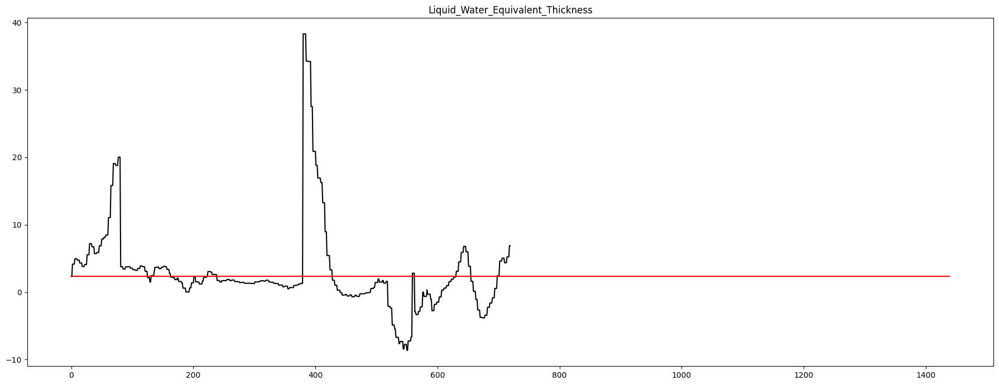

<Figure size 1500x1000 with 0 Axes>

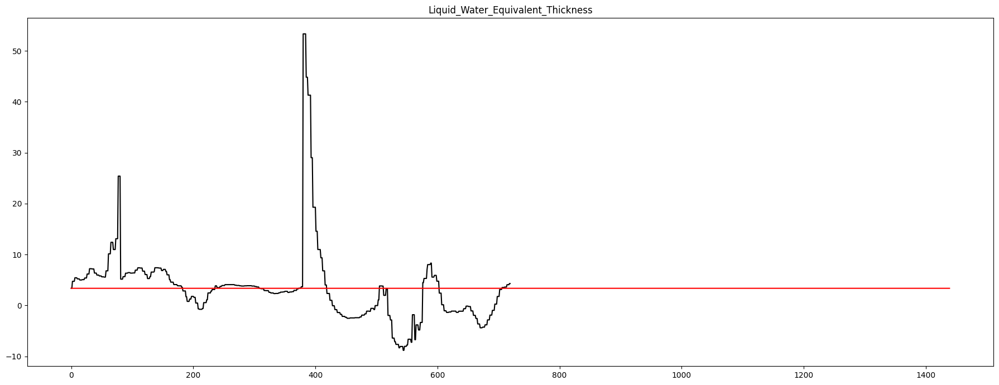

<Figure size 1500x1000 with 0 Axes>

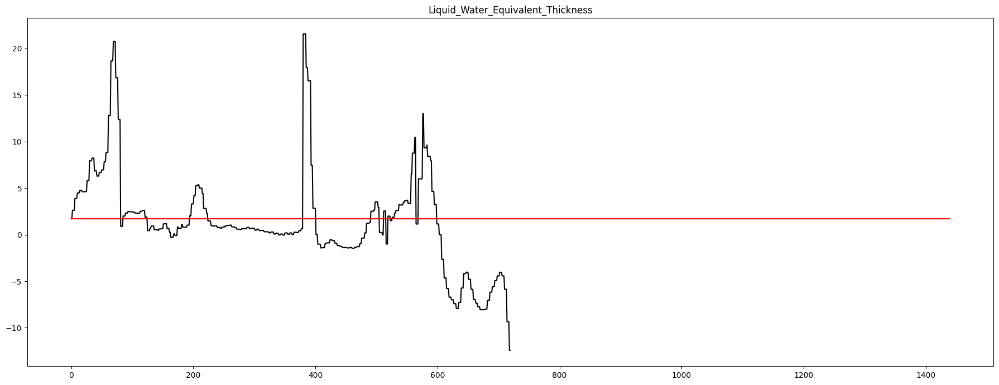

<Figure size 1500x1000 with 0 Axes>

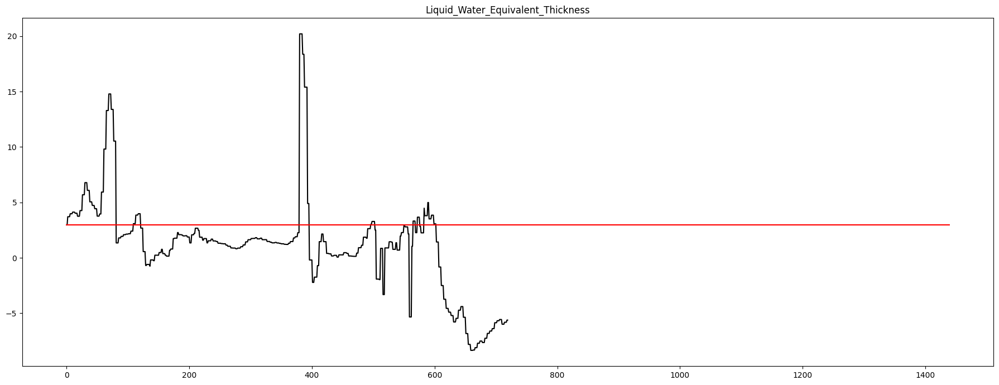

<Figure size 1500x1000 with 0 Axes>

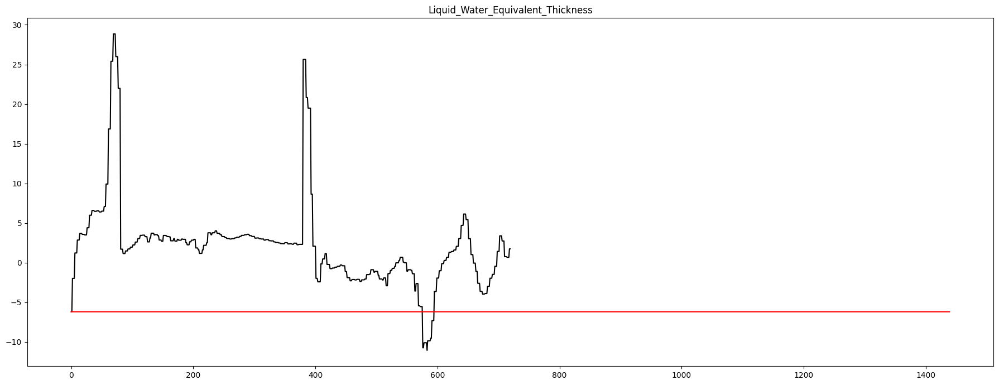

<Figure size 1500x1000 with 0 Axes>

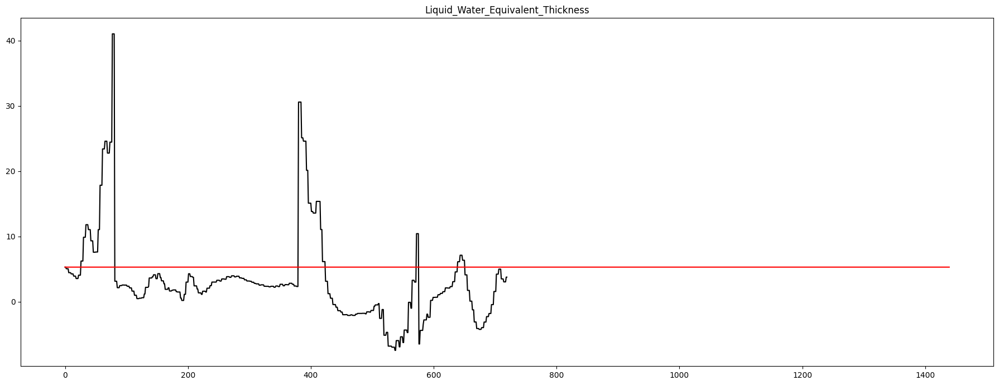

<Figure size 1500x1000 with 0 Axes>

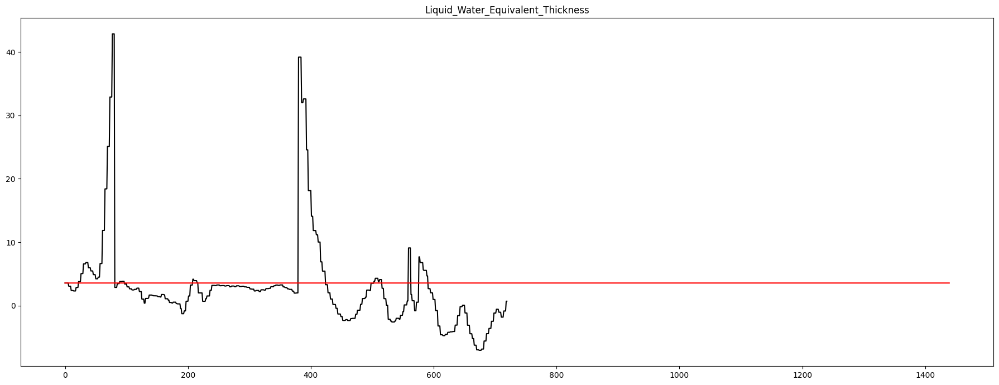

<Figure size 1500x1000 with 0 Axes>

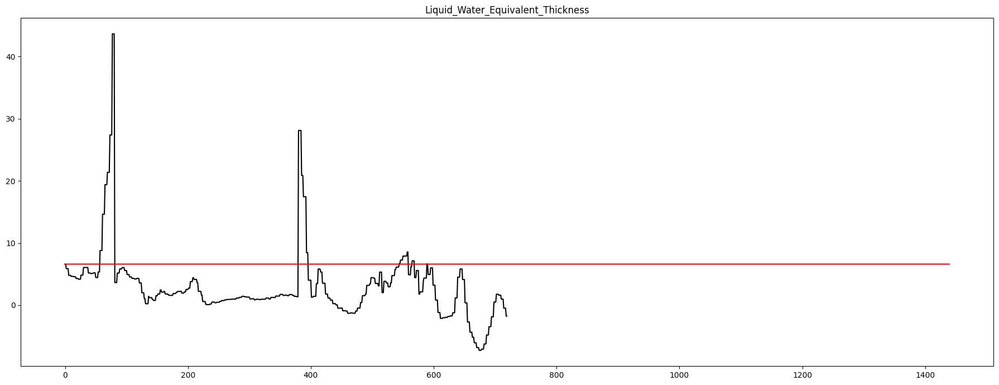

<Figure size 1500x1000 with 0 Axes>

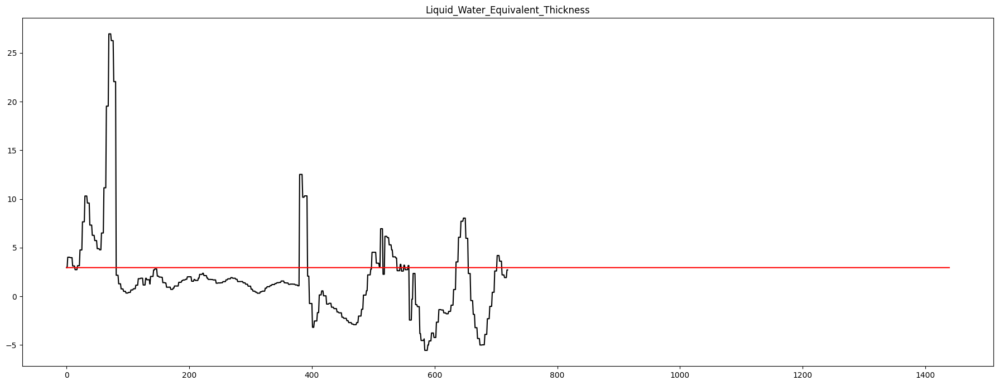

<Figure size 1500x1000 with 0 Axes>

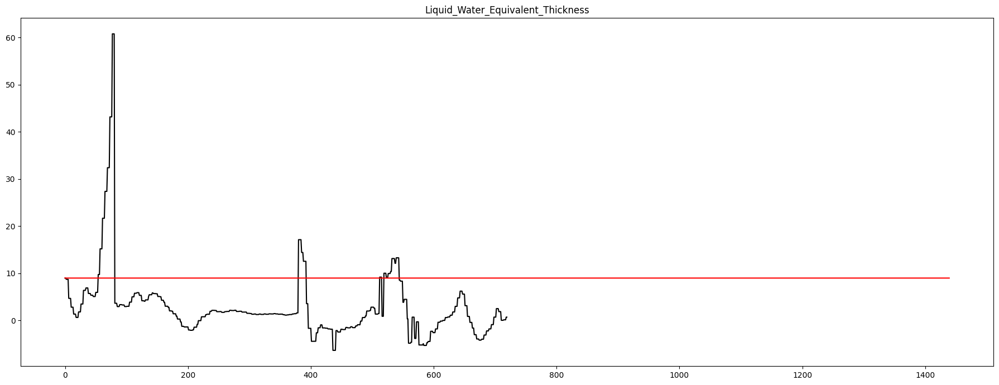

<Figure size 1500x1000 with 0 Axes>

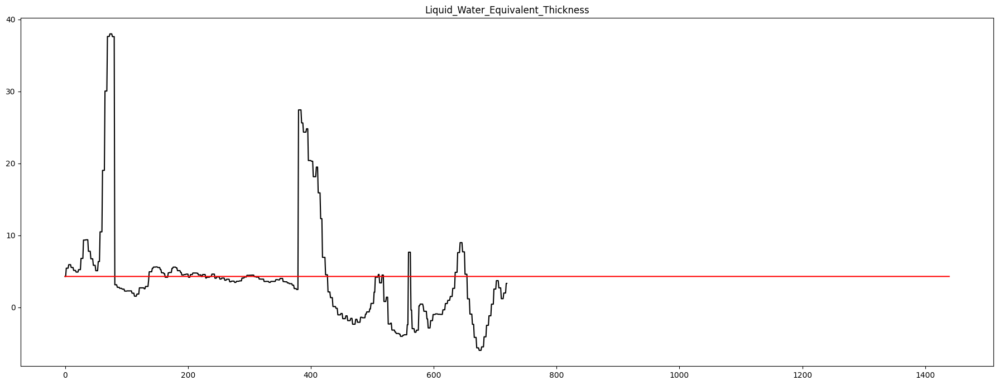

<Figure size 1500x1000 with 0 Axes>

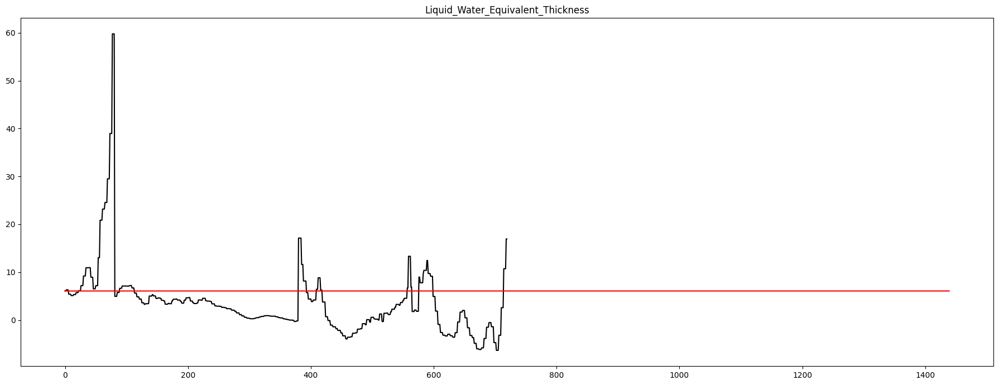

<Figure size 1500x1000 with 0 Axes>

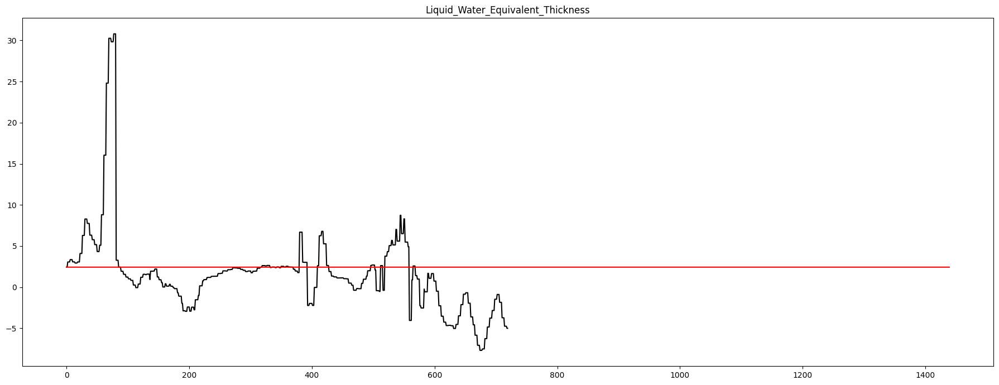

<Figure size 1500x1000 with 0 Axes>

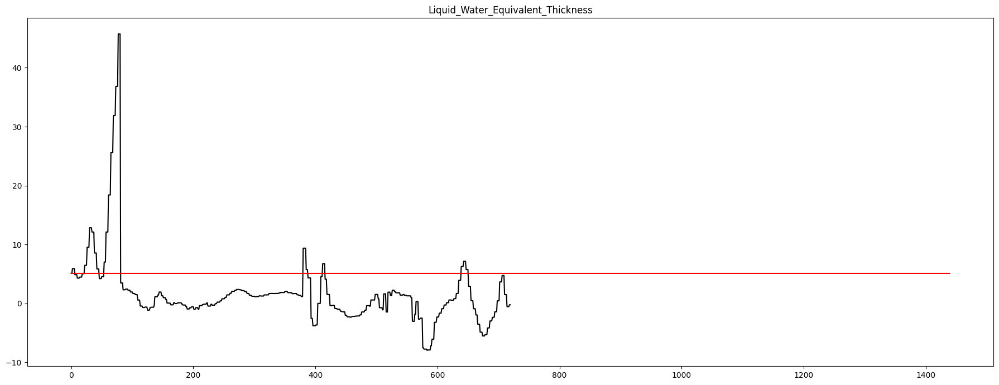

<Figure size 1500x1000 with 0 Axes>

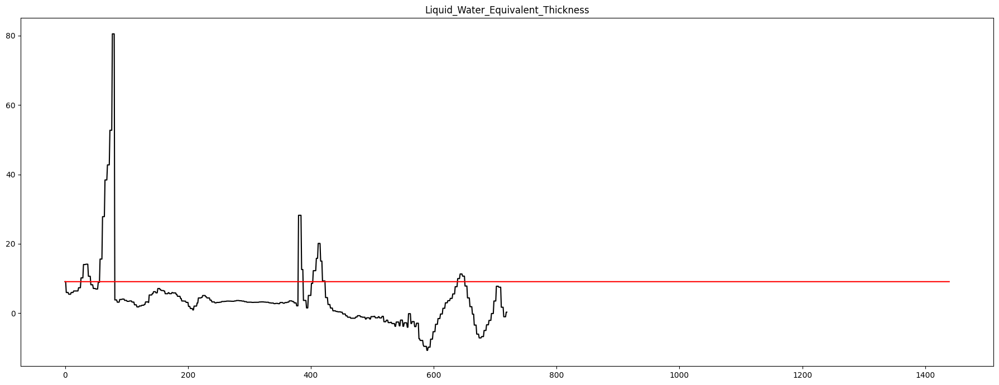

<Figure size 1500x1000 with 0 Axes>

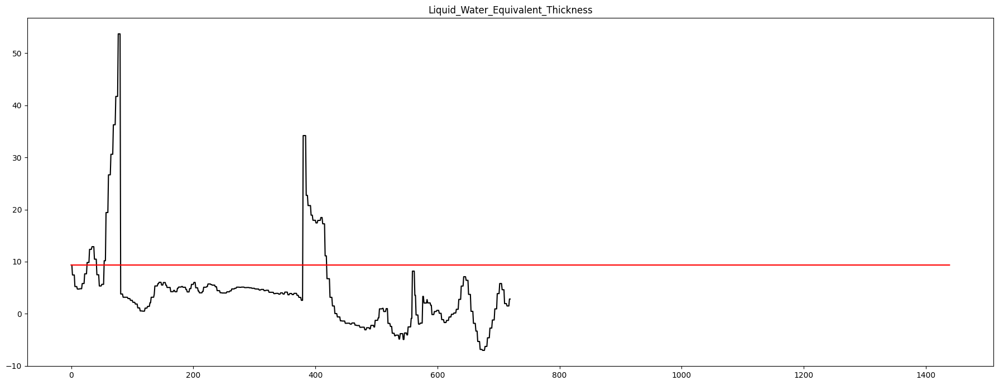

<Figure size 1500x1000 with 0 Axes>

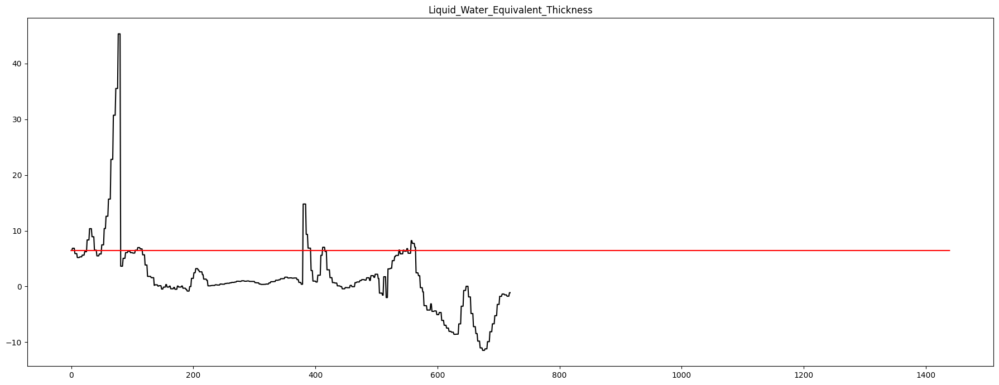

<Figure size 1500x1000 with 0 Axes>

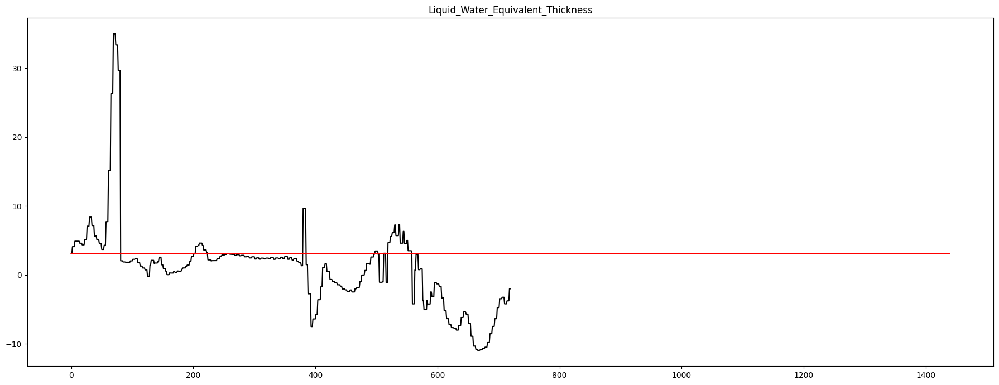

<Figure size 1500x1000 with 0 Axes>

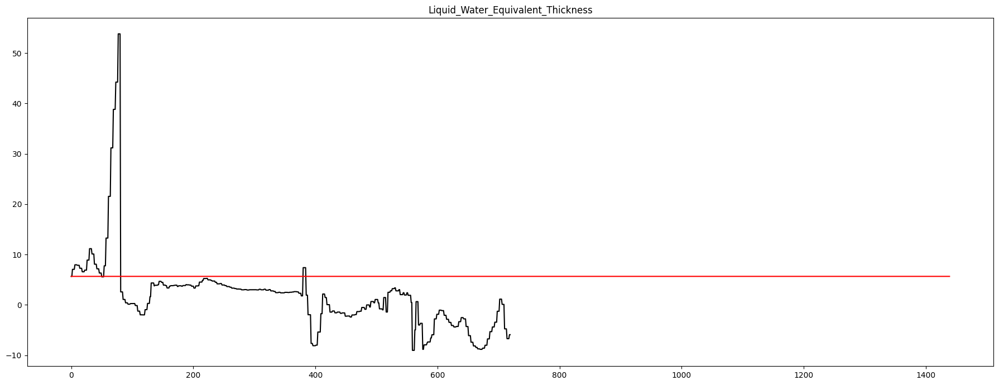

<Figure size 1500x1000 with 0 Axes>

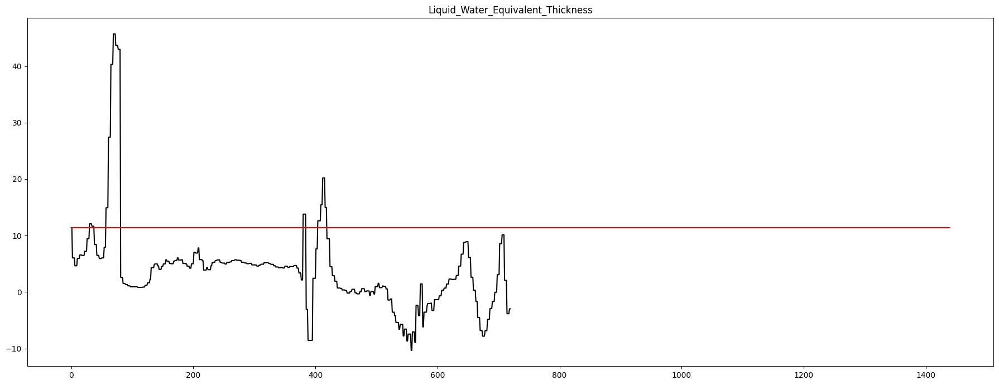

<Figure size 1500x1000 with 0 Axes>

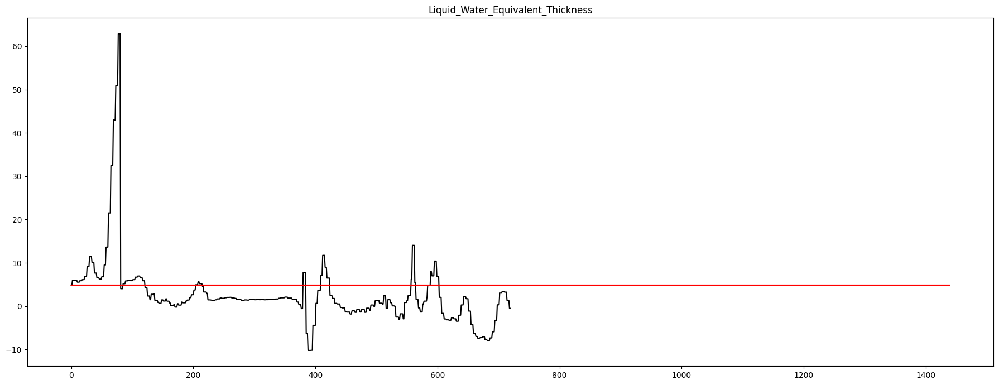

<Figure size 1500x1000 with 0 Axes>

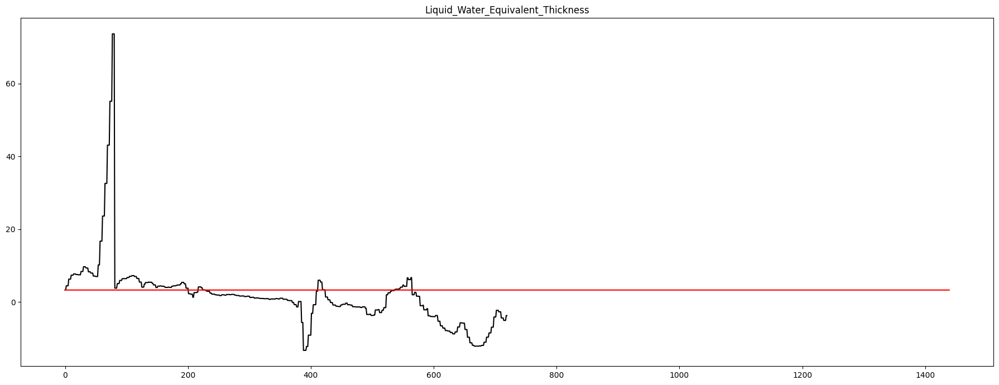

<Figure size 1500x1000 with 0 Axes>

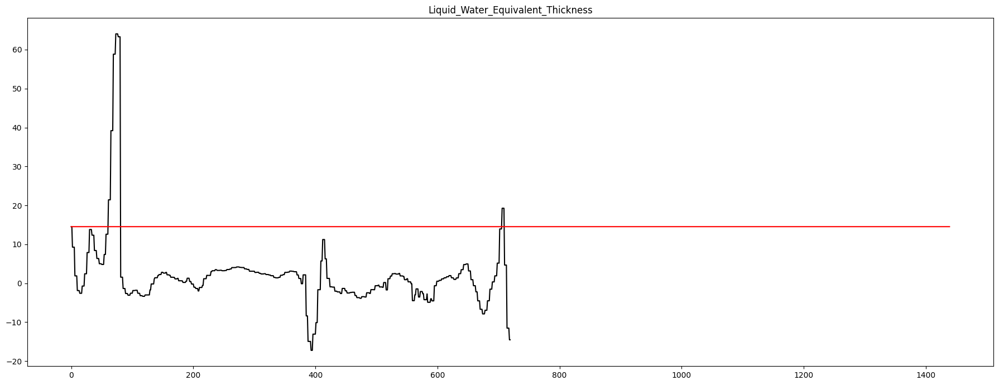

<Figure size 1500x1000 with 0 Axes>

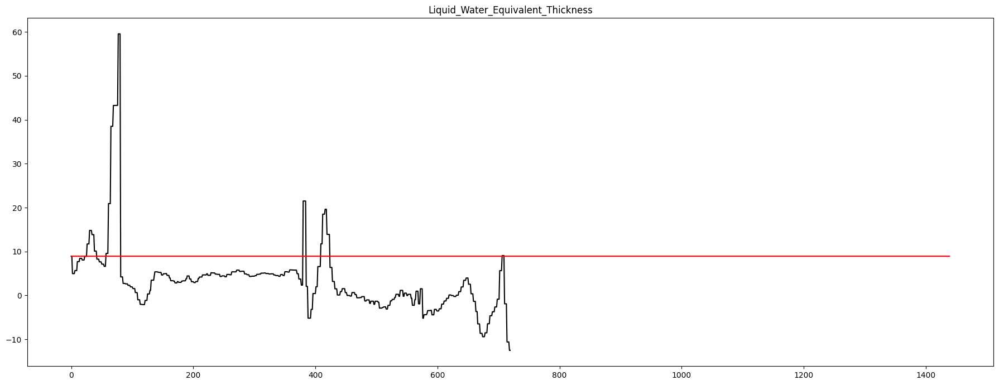

<Figure size 1500x1000 with 0 Axes>

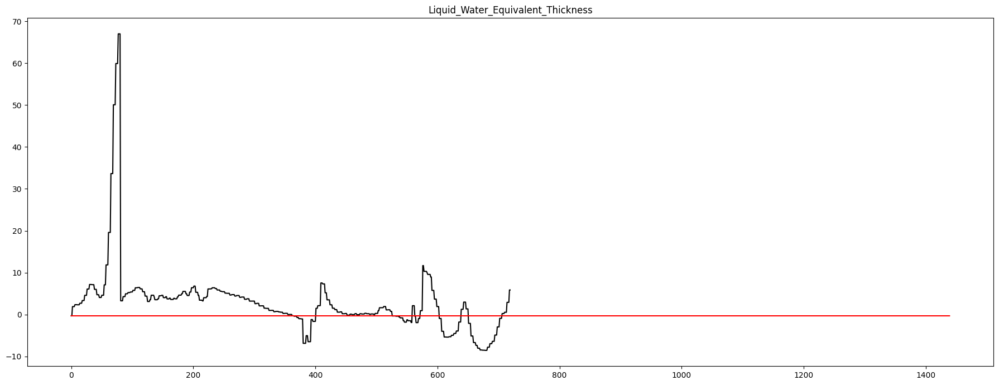

<Figure size 1500x1000 with 0 Axes>

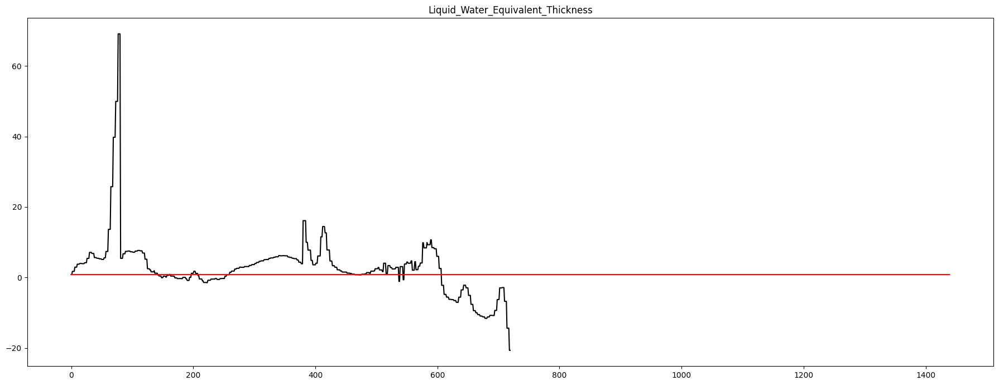

<Figure size 1500x1000 with 0 Axes>

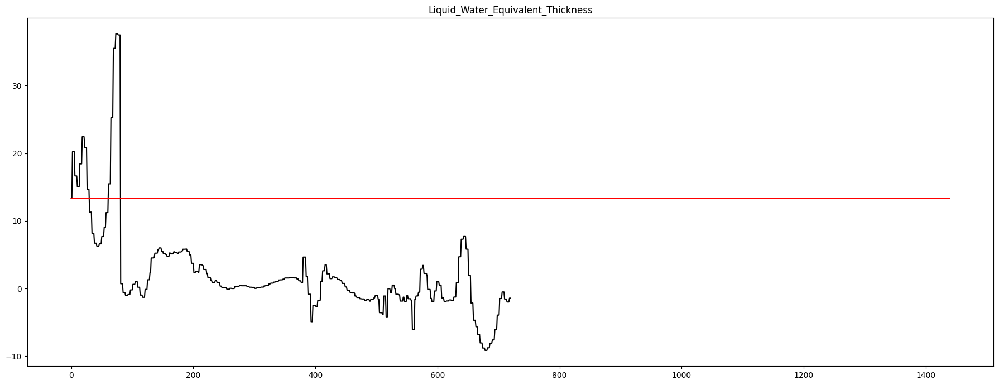

<Figure size 1500x1000 with 0 Axes>

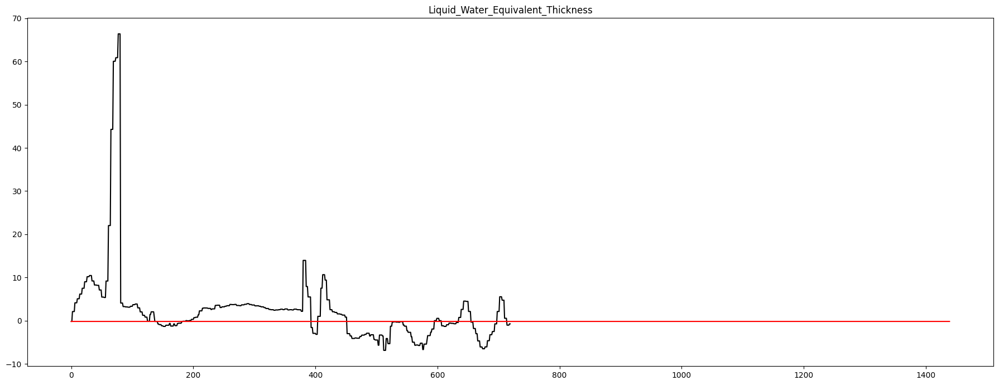

<Figure size 1500x1000 with 0 Axes>

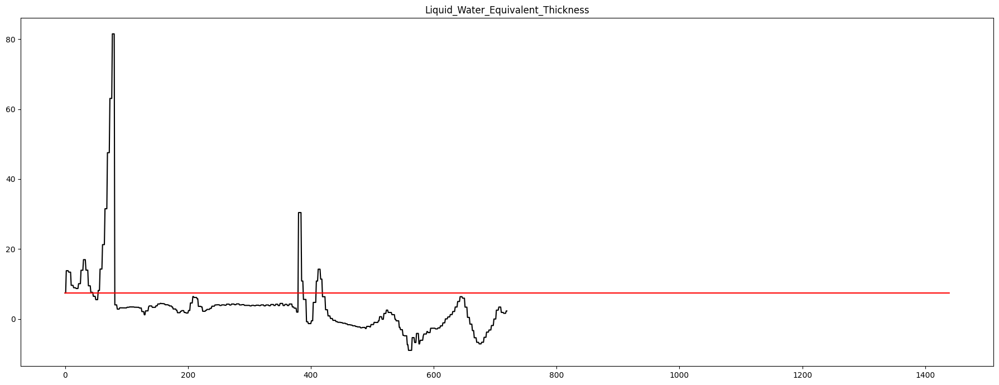

<Figure size 1500x1000 with 0 Axes>

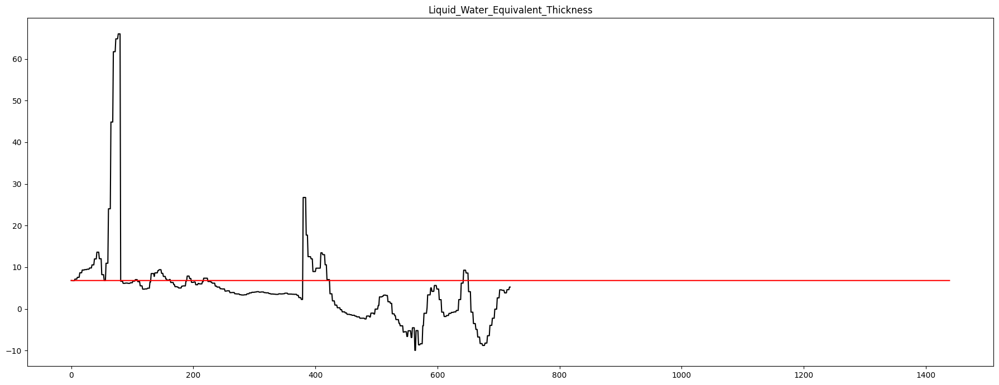

<Figure size 1500x1000 with 0 Axes>

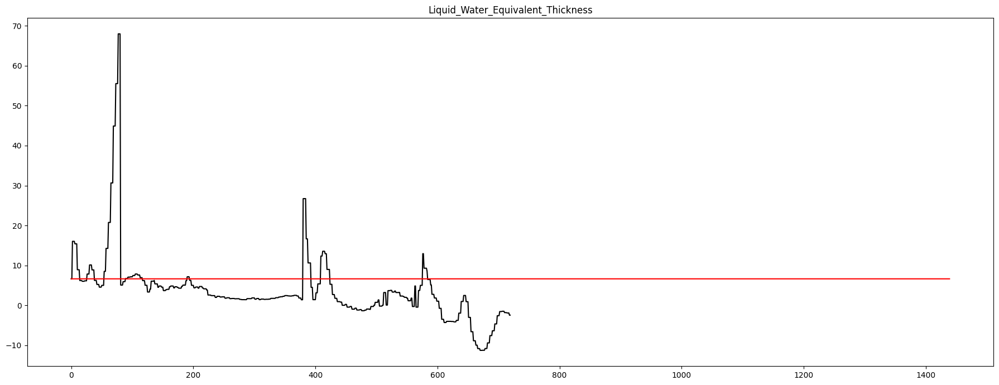

<Figure size 1500x1000 with 0 Axes>

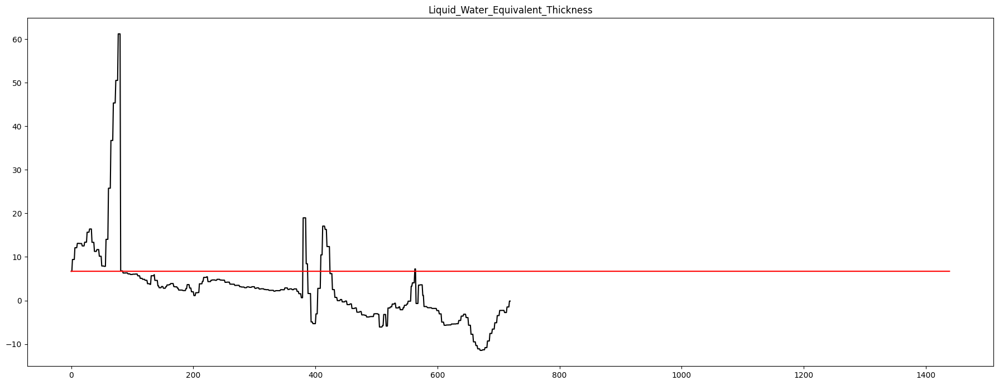

<Figure size 1500x1000 with 0 Axes>

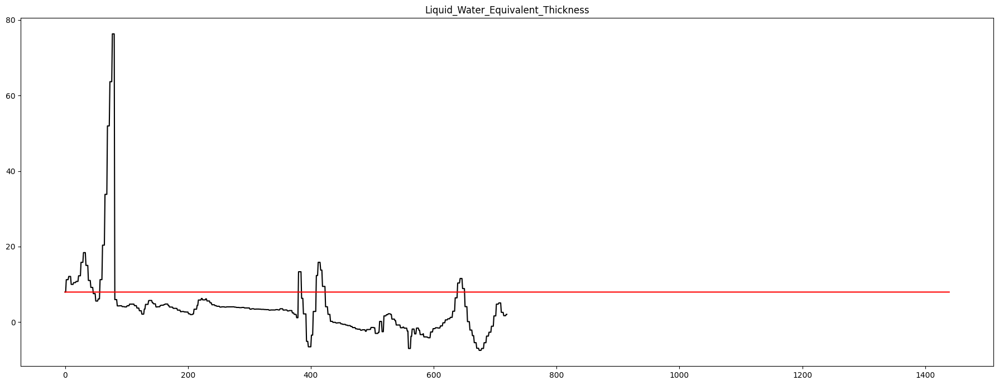

<Figure size 1500x1000 with 0 Axes>

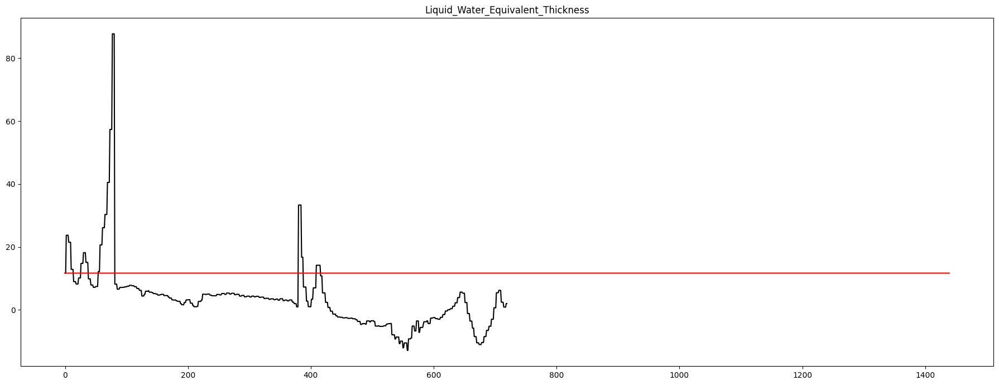

<Figure size 1500x1000 with 0 Axes>

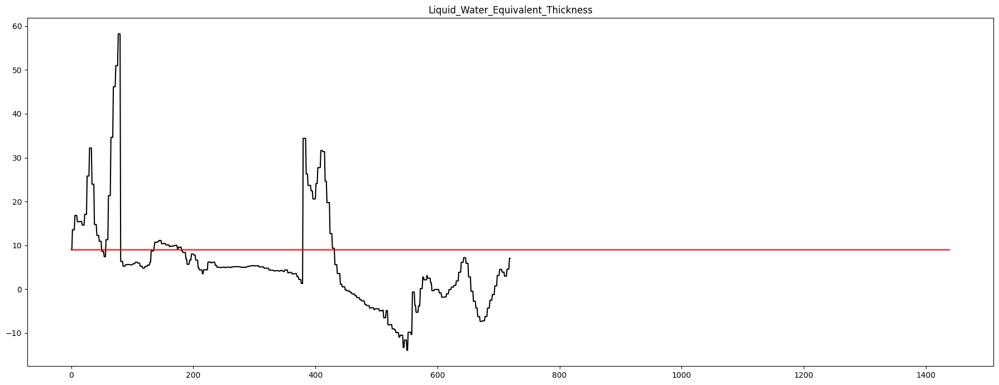

<Figure size 1500x1000 with 0 Axes>

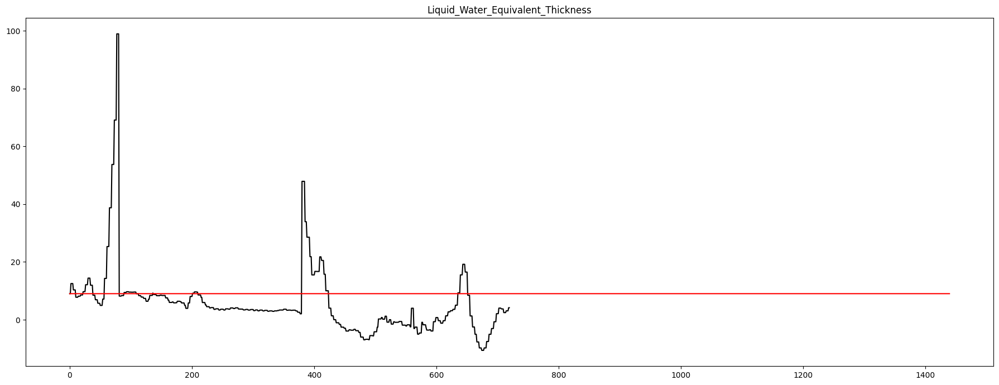

<Figure size 1500x1000 with 0 Axes>

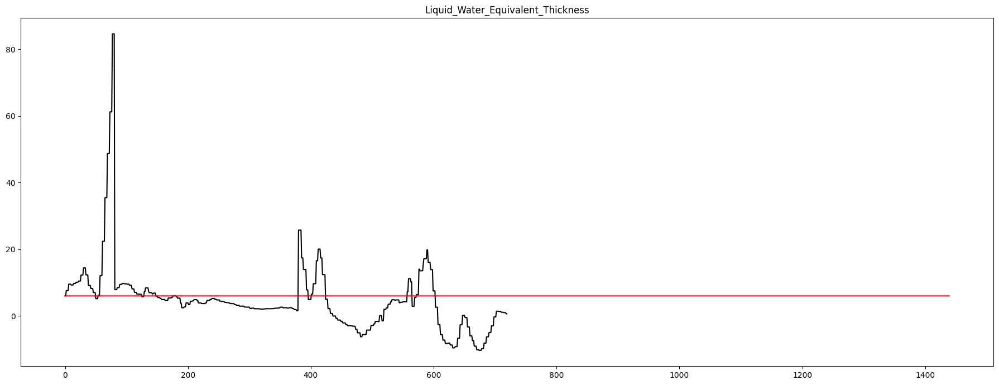

<Figure size 1500x1000 with 0 Axes>

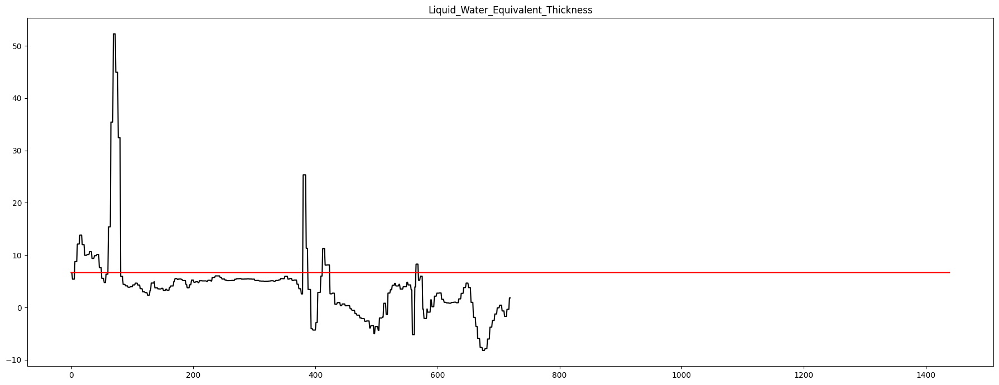

<Figure size 1500x1000 with 0 Axes>

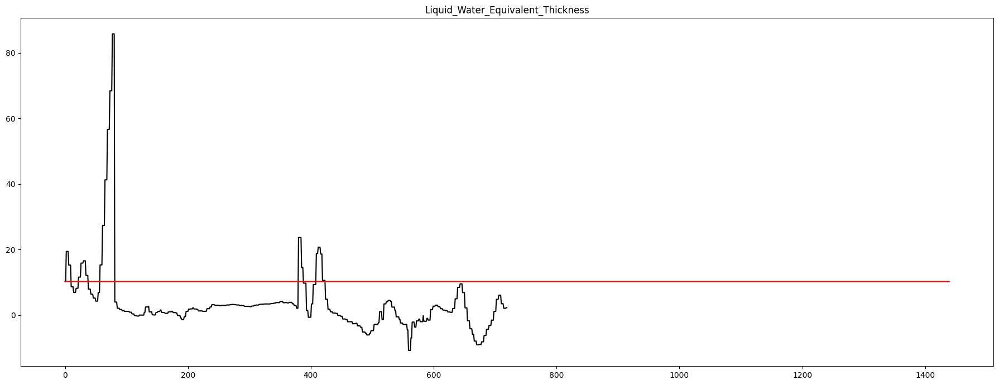

<Figure size 1500x1000 with 0 Axes>

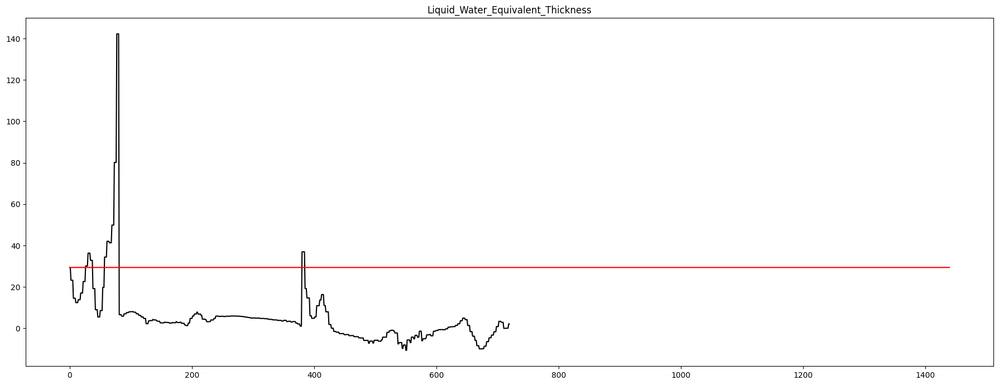

<Figure size 1500x1000 with 0 Axes>

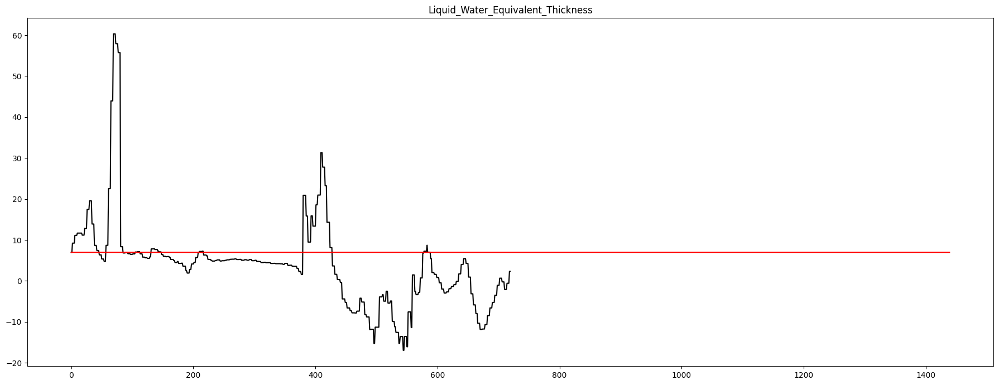

<Figure size 1500x1000 with 0 Axes>

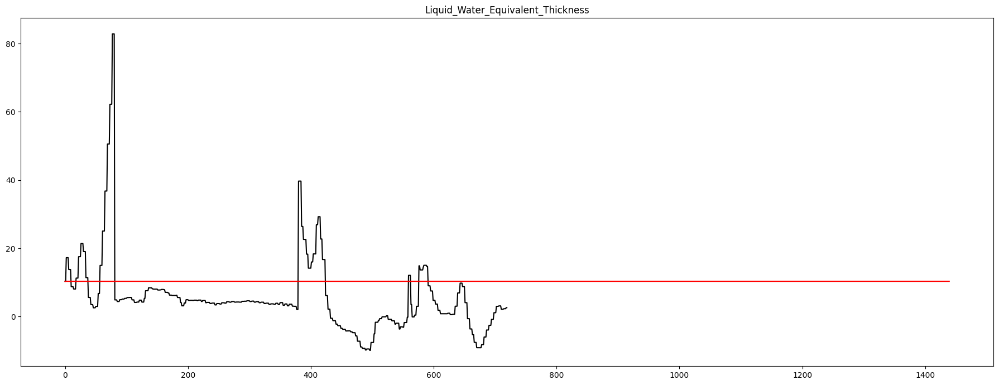

<Figure size 1500x1000 with 0 Axes>

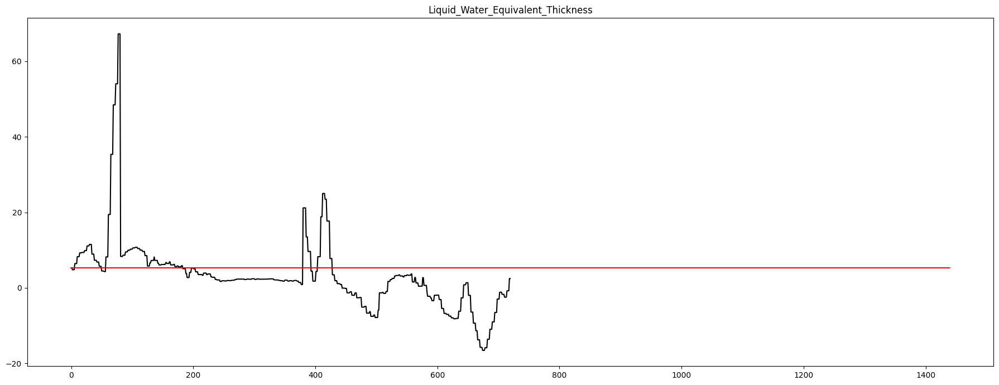

<Figure size 1500x1000 with 0 Axes>

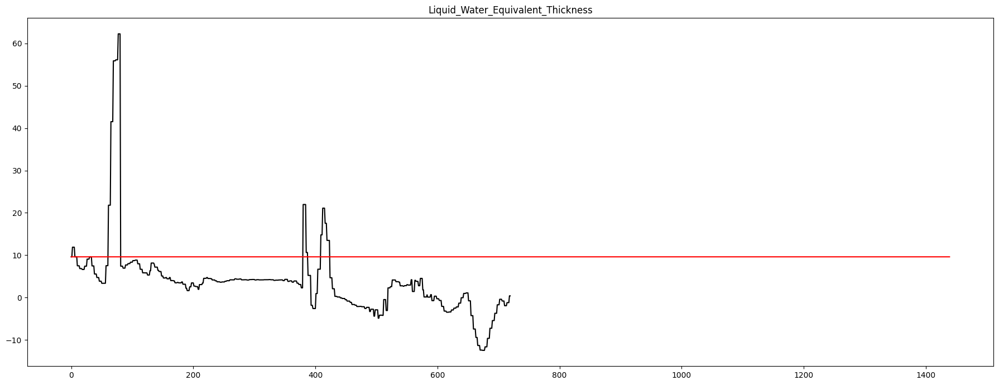

<Figure size 1500x1000 with 0 Axes>

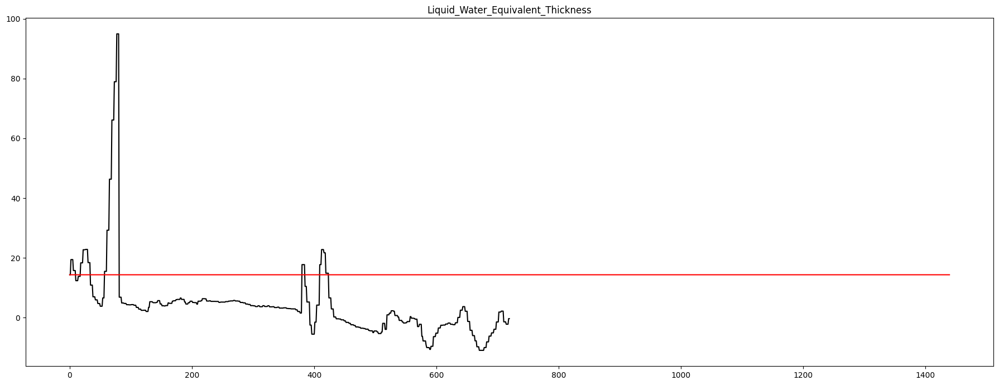

IndexError: index exceeds dimension bounds

<Figure size 1500x1000 with 0 Axes>

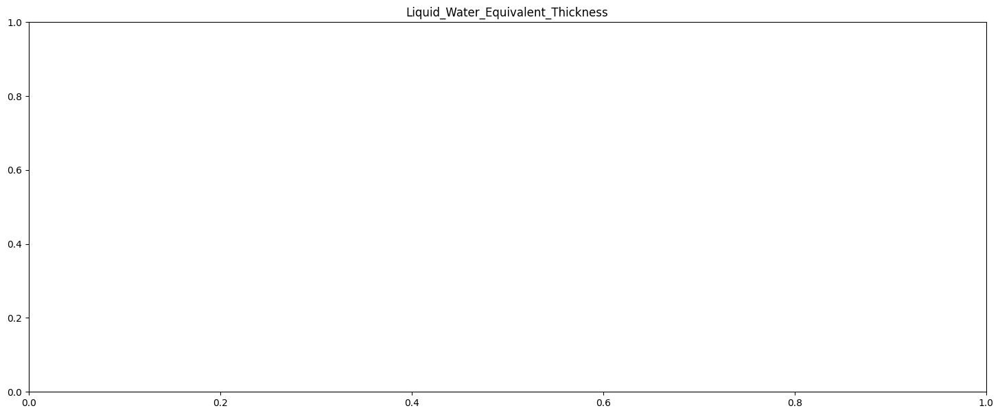

In [51]:
PLOT_LIST = []

for i_count in range(len(READ_CDF.variables["lwe_thickness"][:,0,0])):
    
    figure = plt.figure(figsize=(15,10))
    plt.figure(figsize=(18,7))
    plt.title(READ_CDF.variables["lwe_thickness"].long_name)
    plt.plot(READ_CDF.variables["lwe_thickness"][i_count*2,:,0],color="black")
    plt.plot(READ_CDF.variables["lwe_thickness"][i_count*2,0,:],color="red")
    plt.savefig(f"PLOT_RESULT_{i_count}.jpg")
    
    
    NEW_READING_IMG = cv2.cvtColor(cv2.imread(f"PLOT_RESULT_{i_count}.jpg"),cv2.COLOR_BGR2RGB)
    PLOT_LIST.append(NEW_READING_IMG)
    plt.tight_layout()
    plt.show()

In [52]:
print(len(PLOT_LIST))

99


In [53]:
def displaying_plot(source):
    
    figure = plt.figure(figsize=(16,11))

    Image_List = []
    plt.style.use("dark_background")
    for indexing in source:
        
        Read_IMG = plt.imshow(indexing, animated=True,cmap="hot")
        plt.axis('off')
        Image_List.append([Read_IMG])

    Animation_Func = animation.ArtistAnimation(figure, Image_List, interval=210, repeat_delay=10200)
    
    plt.close()
    
    return Animation_Func

In [54]:
HTML(displaying_plot(PLOT_LIST).to_html5_video())